# Coursework 1: Learning Learning, From Scratch

_COMP0169 Team_

__Niloy J. Mitra & Tobias Ritschel__

TAs:  __Sanjeev Muralikrishnan, Remy Sabathier & Maria Stamatopoulou__

The total points for this exercise is 100.

Please refer to Moodle submission page for the due date.


## Submission instructions:

Coursework submissions must comprise of a zipped folder. Inside this zip, you should have two things.


1.   This Jupyter notebook, containing your code and written comments.
2.   A "models/" folder, containing your trained model weights.


 In the notebook, cells that need to be changed are clearly stated with a &#9998; symbol and you are not allowed to change the rest of the code in any way. Descriptive answers must be contained in the markdown blocks starting with "_Your reply_:". Code must only be written in the space inside the `#begin_solution ... #end_solution` blocks. Code written outside these blocks will not be processed or evaluated.

Please, do not change `#begin_test ... #end_test` blocks, these blocks are for TAs.

Each exercise must be implemented from scratch. Unless differently specified, only numpy and matplotlib are allowed. The libraries are imported in [the package cell](#packages) and cannot be modified.



**Questions:**

[Question 1](#question1): Linear Fitting (10 points)

[Question 2](#question2): PCA (12 points)

[Question 3](#question3): Linear Classification (18 points)

[Question 4](#question4): Image Denoising (30 points)

[Question 5](#question5): Neural Implicit Representation (30 points)

## Datasets

We will be using several datasets for the coursework: _IRIS_ , _MNIST_ , _CelebA_ , _NoisyOCR_.

_IRIS_ and _MNIST_ datasets will be downloaded directly in the notebook using the `skdataset` library. Keep in mind that you will need to be connected to Internet to be able to download the datasets. If you want to work offline, you are free to save your dataset to npy file locally and load them while offline although this is not officially supported.

_CelebA_ and _NoisyOCR_ are provided separately in a zip file; make sure to unzip it and the unzipped folder is placed in the same directory as the notebook.


**_IRIS_**: The _IRIS_ dataset contains the following features in order: _sepal length_, _sepal width_, _petal length_, _petal width_. Classes names are: __Iris Setosa__ for label **0**, __Iris Versicolour__ for label **1**, and __Iris Virginica__ for label **2**.

**_MNIST_**: _MNIST_ is a dataset composed of images of handwritten digits.

**_CelebA_**: _CelebA_ is a dataset composed of
RGB images of human faces.

**_NoisyOCR_**: _NoisyOCR_ is a dataset composed of
images of noisy OCR scans, along with corresponding clean target images.

The script will generate two subsets for each of the two datasets, a training subset (**X\_dataset** and **Y\_dataset** with **dataset** the name of the dataset) and a test subset (**X\_dataset\_test** and **Y\_dataset\_test**).

We will test correctness of your code on _Hidden_ set.

**Warning:** as _Hidden_ may have different dimensions from _IRIS_ and _MNIST_, hard-coded solutions may not work, thus resulting in lower grades. You need to make sure that your code would work if applied on a different number of samples and a different number of features/pixels.

## Instructions for the other datasets zip file:
**Download Link:** https://geometry.cs.ucl.ac.uk/mlvc/cw_datasets.zip

You can download this zip locally, unzip it and keep the folder in the same directory as your Notebook. There is code provided below to download and unzip it. If you're using Colab, the downloaded content will remain only while the session is active. When you start a new session, you'd have to download it again.

**Google Drive:** For a more permanent solution, you can upload the *unzipped* folder to your own Google Drive, and mount your drive in the notebook. Code is provided below, to mount the drive.

You can use either options, and a variable `drive_mount` is provided to toggle between the two. Set this variable accordingly.

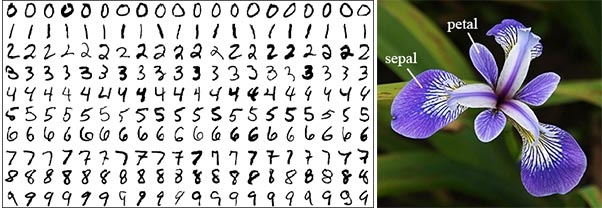

The following cell imports all packages needed in the coursework. You are not allowed to use any other packages than the ones listed below.
<a name='packages'></a>

In [1]:
# Importing packages
import numpy as np
import random
import os

import matplotlib.pyplot as plt

from scipy import optimize
from sklearn import datasets as skdataset
from sklearn.model_selection import train_test_split
from pathlib import Path

import os
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch.utils.data import Dataset

import imageio
from PIL import Image
import cv2

from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio
from IPython.display import Video
plt.style.use('default')
%matplotlib inline

The following code imports the drive module from Colab. This code will only run on Colab. If you're not using Colab, comment this code out, or don't run this cell.

In [2]:
## from google.colab import drive

#Unmount any previously mounted drive if needed.
#Feel free to uncomment below line when you need to unmount Drive

#drive.flush_and_unmount()

The following cell sets the `drive_mount` variable. Set it to `True` if your Dataset folder is on drive. If you plan to use the Dataset folder locally, then set this to `False`

In [2]:
drive_mount = False

In [3]:
# Setting the seed
RAND_ST = 42
random.seed(RAND_ST)
#begin_test


#end_test




## Data Loading

The following cells are used to load IRIS and MNIST datasets.

In [4]:
def load_iris_dataset(num_classes=2):
    # Load the datadet from SkDataset
    iris = skdataset.load_iris()
    X = iris.data
    Y = iris.target
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

In [5]:
def load_mnist_dataset(num_classes=2):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

def load_mnist_dataset_onevsall(class_id=7):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # One versus all
    idx = Y == class_id
    Y[~idx] = 0
    Y[idx]  = 1
    return X, Y

## Functions for visualization

In [6]:
def plot_correlation(X1, X2):
    # Plot both variables
    plt.figure(figsize=(8, 6))
    plt.clf()
    plt.scatter(X1, X2, edgecolor='k')
    line = np.linspace(min(X1.min(), X2.min()), max(X1.max(), X2.max()), 20)
    plt.plot(line, line, 'r')
    plt.xlabel('Variable 1')
    plt.ylabel('Variable 2')
    plt.show()

In [7]:
def plot_eigenvecs(stacked_images, n_rows, n_columns, img_shape=None, channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)
        if channels == 1:
            # Normalize eigen vector to [0, 255] range
            eigenvector = stacked_images[i] - np.min(stacked_images[i])
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(np.reshape(eigenvector, [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray')
        elif channels == 3:
            # Normalize eigen vector to [0, 255] range for each channel
            eigenvector = stacked_images[i].reshape(img_shape[0], img_shape[1], 3)
            eigenvector -= np.min(eigenvector)
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(eigenvector)
        plt.axis('off')
    plt.show()

def plot_images(stacked_images, n_rows, n_columns, titles, num_channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)

        if num_channels == 1:
            # Grayscale image
            plt.imshow(np.reshape(stacked_images[i], [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray', vmin=0, vmax=1)
        elif num_channels == 3:
            # RGB image
            image = np.reshape(stacked_images[i], [int(np.sqrt(n_dims // 3)), int(np.sqrt(n_dims // 3)), 3])
            image = np.clip(image, 0, 1)  # Ensure pixel values are within [0, 1] range
            plt.imshow(image)
        else:
            raise ValueError("Unsupported number of channels. Use num_channels=1 for grayscale or num_channels=3 for RGB.")

        plt.axis('off')

        if len(titles) == n_rows * n_columns:
            plt.title(titles[i])

    plt.show()

def plot_images_with_text(images, titles, texts=None):
    N_cols = len(images)
    N_rows = len(images[0])

    fig, axs = plt.subplots(N_rows, N_cols, figsize=(20, 15))

    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])

    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j,i].imshow(img, interpolation='nearest')
            axs[j,i].axis('off')
            if texts is not None:
                axs[j,i].text(0.5,-0.1, str(texts[j][i])[:4], size=10, ha="center", transform=axs[j,i].transAxes)
    plt.show()



In [8]:
def plot_images_horizontal(imgs):
    num_imgs = len(imgs)
    f = plt.figure(figsize=(40, 15))
    for i in range(num_imgs):
        f.add_subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
    plt.show()

In [9]:
def true_positive(Y_test, y_pred):
    mask = (Y_test == 1)
    tp = (Y_test[mask] == y_pred[mask]).sum()
    return tp.item()

def true_negative(Y_test, y_pred):
    mask = (Y_test == 0) | (Y_test == -1)
    tn = (Y_test[mask] == y_pred[mask]).sum()
    return tn.item()

def false_negative(Y_test, y_pred):
    mask = (y_pred == 0) | (y_pred == -1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def false_positive(Y_test, y_pred):
    mask = (y_pred == 1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def plot_confusion_matrix(Y_test, y_pred):
    tp = true_positive(Y_test, y_pred)
    tn = true_negative(Y_test, y_pred)
    fp = false_positive(Y_test, y_pred)
    fn = false_negative(Y_test, y_pred)
    cf = np.array([[tn, fp], [fn, tp]])
    fig, ax = plt.subplots()
    ax.matshow(cf, cmap=plt.cm.Blues)
    for i in range(2):
        for j in range(2):
            c = cf[i,j]
            ax.text(j, i, str(c), va='center', ha='center')
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.show()

## Data Loading

In the following cells, the dataset is created with proper splits between training and test set.

_IRIS_ dataset

In [10]:
X, Y = load_iris_dataset(num_classes=3)
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

_MNIST_ **dataset**

In [11]:
X, Y = load_mnist_dataset(num_classes=10)
X = X / 255.0
X_mnist, X_mnist_test, Y_mnist, Y_mnist_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

d:\Anaconda\envs\godzilla\Lib\site-packages\sklearn\datasets\_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


**Code for handling the Dataset zip file**

The following cell mounts your drive if `drive_mount` is `True`

In [13]:
if drive_mount:
  drive.mount('/content/drive')

Set `dataset_path` to Drive or local directory. Also load the CelebA dataset for PCA

In [12]:
if drive_mount:
  dataset_path = '/content/drive/MyDrive/cw_datasets/'
  assert(os.path.exists(dataset_path))
  # Set this path to your appropriate drive path
else:
  dataset_path = "./cw_datasets"
  # In this case, the datasets path is assumed to be in the same directory as this notebook

  if not os.path.exists("./cw_datasets"):
    !wget https://geometry.cs.ucl.ac.uk/mlvc/cw_datasets.zip
    !unzip -q -o cw_datasets.zip

def load_face_images_array(dataset_path="./cw_datasets/",test_fraction=0.05):
  images_path = os.path.join(dataset_path,"face_pca/")
  flattened_images_list = []
  images_paths = [os.path.join(images_path,p) for p in os.listdir(images_path) if p.endswith(".jpg")]
  for image_file in images_paths:
    image_np = np.array(Image.open(image_file))/255.0
    image_np_flattened = np.reshape(image_np,(1,-1))
    flattened_images_list.append(image_np_flattened)
  flattened_images = np.concatenate(flattened_images_list,0)
  split_at = int(len(flattened_images)*test_fraction)
  X_CelebA_test = flattened_images[:split_at]
  X_CelebA = flattened_images[split_at:]
  return X_CelebA, X_CelebA_test

X_CelebA,X_CelebA_test = load_face_images_array(dataset_path)
print(X_CelebA.shape,X_CelebA_test.shape)

(95, 3072) (5, 3072)


## 1. Linear Fitting (10 points)
<a name='question1'></a>

[a)](#question1a) Implement the normal equation solver function **nsolve**, which takes as input the matrix **X** and the target vector **y** and returns the optimized weights **w**. Test your code with your own mockup/randomly created data. (**5 points**)

[b)](#question1b) Implement **line_fit(X,y)** which should fit a linear function to the input data. Test your implementation on the following task: predict with linear fitting the _petal length (cm)_ of the Iris dataset using the three remaining variables as inputs (_sepal length (cm)_, _sepal width (cm)_ and _petal width (cm)_). Report the L2 loss on the validation set and plot a graph showing the correlation between y and your prediction on the test set. (**2 points**)

[c)](#question1c) Implement **poly_fit(X,y)** which should fit a 2nd degree polynomial to the input data. Test your implementation on the following task: predict with the polynomial the petal width (cm) of the _IRIS_ dataset using the three remaining variables as inputs (sepal length (cm), sepal width (cm), petal length (cm)). The 2nd degree polynomial should consider all possible pairwise terms, i.e. $w_1x^2 + w_2xy+ w_3y^2 + w_4x+ w_5y+ w_6$ in the case of two input variables $x$ and $y$. Report the L2 loss on the validation set and plot a graph showing the correlation between $y$ and your prediction on the test set. (**3 points**)

**Question 1a**
<a name='question1a'></a>

Implement the nsolve function

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [15]:
def nsolve(X,y):
    """
    Write your implementation of nsolve here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    """
    #begin_solution
    # Add a column of ones to X for the bias term 为了处理y = wX + b 中的b
    X_b = np.c_[np.ones((X.shape[0], 1)), X] #connect
    
    # Calculate the weights using the normal equation
    w = np.linalg.inv(X_b.T @ X_b) @ X_b.T @ y
    #end_solution


    return w

Testing your code on mockup/randomly created data.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [16]:
"""
After implementing nsolve, test it below on some mock data using np.random
"""

#begin_solution
plt.style.use("default")
np.random.seed(420)
X = np.random.rand(50) * 10 
y  = 2 * X - 5  +  np.random.randn(50)
weights = nsolve(X, y)

print("Optimized Weights:")
print(weights) # the result is very cloase to (-5, 2)
#end_solution


Optimized Weights:
[-4.88416091  1.93715154]


**Question 1b**
<a name='question1b'></a>

Implement the line_fit function and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [17]:
def line_fit(X,y):
    """
    Write your implementation of line_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 Prediction error using learned w
    """

    #begin_solution
    w = nsolve(X, y)
    X_b = np.c_[np.ones((X.shape[0], 1)), X]
    y_pred = X_b @ w
    l2_error = np.mean((y_pred - y) ** 2)
    #end_solution


    return w, l2_error


Testing your code on _IRIS_

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [18]:
"""
After implementing line_fit, test it below on IRIS Train set.
Print the L2 error on the Training set.
"""

#begin_solution
X_para, y_para = load_iris_dataset(num_classes=3)
X = X_para[:, np.r_[:2, 3]]  # 使用 sepal length、sepal width 和 petal width 作为特征
y = X_para[:, 2]    # 预测 petal length
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

weights, l2_loss = line_fit(X_iris, Y_iris)
# Calculate L2 loss on the validation set
print("L2 Loss on Validation Set:", l2_loss)

#end_solution


L2 Loss on Validation Set: 0.092542803230504


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [19]:
"""
After implementing line_fit, test it below on IRIS Test set.
Print the L2 error with respect to Test set.
"""

#begin_solution
# Predict on the validation set
weights_test, l2_loss = line_fit(X_iris_test, Y_iris_test)
# Calculate L2 loss on the validation set
print("L2 Loss on Validation Set:", l2_loss)
#end_solution


L2 Loss on Validation Set: 0.10892540899202925


Showing the correlation between X and y.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

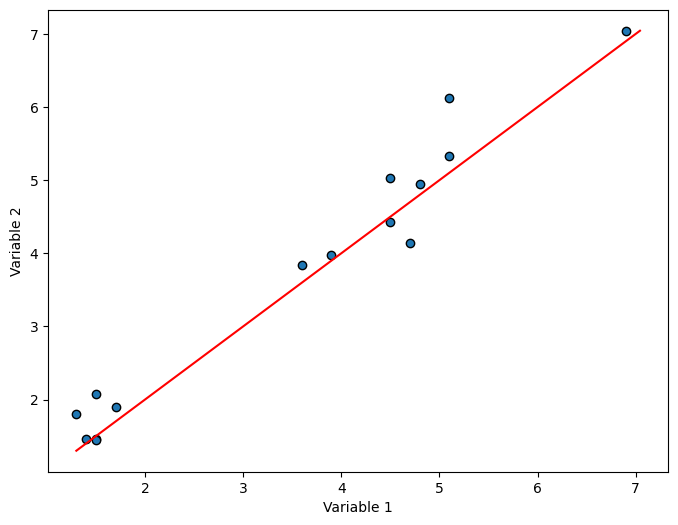

In [20]:
"""
Below, plot and display the correlation between true y and predicted values.
"""
#begin_solution
# plt.scatter(Y_iris_test, y_test_pred)
# plt.xlabel("Actual Petal Length (cm)")
# plt.ylabel("Predicted Petal Length (cm)")
# plt.title("Correlation between Actual and Predicted Petal Length")
# plt.show()
X_iris_test_b = np.c_[np.ones((X_iris_test.shape[0], 1)), X_iris_test]
y_test_pred = X_iris_test_b @ weights
plt.style.use('default')
plot_correlation(Y_iris_test, y_test_pred)
#end_solution


Do not write anything in the cell below, it is for TAs

In [21]:
#begin_test


#end_test

**Question 1c**
<a name='question1c'></a>

Implement the poly_fit function and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [22]:
def poly_fit(X,y):
    """
    Write your implementation of poly_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 prediction error using learned w
    """
    #begin_solution
    # Add quadratic and interaction terms manually
    X_b = np.c_[X, X[:, 0]**2, X[:, 1]**2, X[:, 2]**2, X[:, 0]*X[:, 1], X[:, 0]*X[:, 2], X[:, 1]*X[:, 2]]

    # Add a column of ones for the bias term
    X_poly = np.c_[np.ones((X_b.shape[0], 1)), X_b]

    # Use the normal equation to calculate the weights
    w_poly = np.linalg.inv(X_poly.T.dot(X_poly)).dot(X_poly.T).dot(y)

    # Calculate the predictions on the training set
    y_pred_poly = X_poly @ w_poly

    # Calculate L2 prediction error
    l2_error = np.mean((y_pred_poly - y)**2)
    #end_solution
    
    return w_poly, l2_error

Testing your code on _IRIS_.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [23]:
"""
After implementing poly_fit, test it below on IRIS Training set.
Print L2 error with respect to training set.
"""

#begin_solution
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, y, test_size=0.1, random_state=RAND_ST)
weights_poly, l2_loss_poly = poly_fit(X_iris, Y_iris)
print(l2_loss_poly)
#end_solution


0.07314492344815958


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [24]:
"""
After implementing poly_fit, test it below on IRIS Test set.
Print L2 error with respect to test set.
"""

#begin_solution
weights_poly, l2_loss_poly = poly_fit(X_iris_test, Y_iris_test)
print(l2_loss_poly)
#end_solution


0.0559903687254832


Showing the correlation between X and y.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

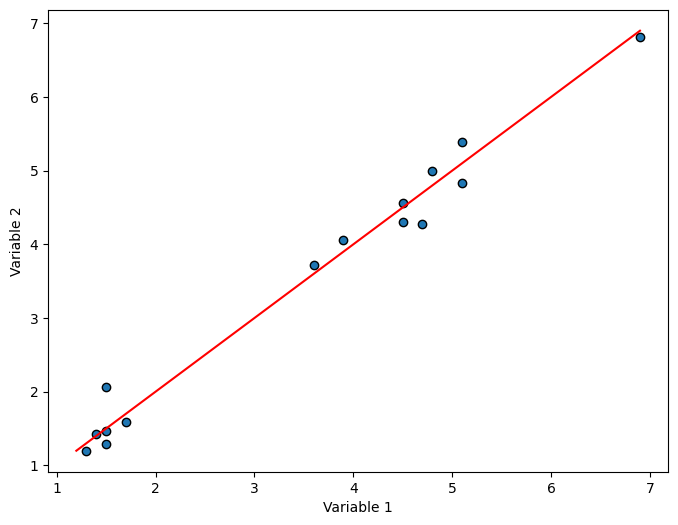

In [25]:
"""
Below, plot and display the correlation between true y and predicted values
"""

#begin_solution
X_b = np.c_[X_iris_test, X_iris_test[:, 0]**2, X_iris_test[:, 1]**2, X_iris_test[:, 2]**2, X_iris_test[:, 0]*X_iris_test[:, 1], X_iris_test[:, 0]*X_iris_test[:, 2], X_iris_test[:, 1]*X_iris_test[:, 2]]
X_poly = np.c_[np.ones((X_b.shape[0], 1)), X_b]
y_test_pred = X_poly @ weights_poly
plot_correlation(Y_iris_test, y_test_pred)
#end_solution


Do not write anything the cell below, it is for TAs

In [26]:
#begin_test


#end_test



## 2. PCA (12 points)
<a name='question2'></a>

[a)](#question2a) Implement a function pca(X, ndims) that performs PCA over the input data X and returns both the mean vector  ̄X and the ndims top components. The top components are the eigen vectors linked to the top eigen values computed from the covariance matrix. Try your function on the _MNIST_ dataset (which is composed of 10 digit classes) and on the _CELEBA_ dataset (which contains face RGB images). Display the top 10 components fitted on the train dataset as images.(**2 points** + **2 points** + **2 points**)

[b)](#question2b) Next, check that you can reconstruct perfectly an input image (digit or face) from the test set using all components, by implementing pca_projection(X, mean_vec, eig_vecs) and pca_reconstruction(weights, mean_vec, eig_vecs). (**2 points** + **2 points** + **2 points** on hidden dataset)

**Question 2a**
<a name='question2a'></a>

Implement PCA and plot Eigenvectors

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [27]:
def pca(X, ndims, num_image_channels=1):
    """
    Compute PCA on a batch of flattened grayscale or RGB images with dynamic dimensions.

    Arguments:
    X : Data matrix where each row is a flattened image
    ndims : Number of reduced dimensions

    Returns:
    mean_vec : Data mean
    top_eig_vecs : Selected eigen vectors, a matrix where each column corresponds
                    to an eigen vector
    """

    #begin_solution
    # Calculate the mean of the data
    mean_vec = np.mean(X, axis=0)
    # Center the data by subtracting the mean
    centered_X = X - mean_vec
    # Calculate the covariance matrix
    cov_matrix = np.cov(centered_X, rowvar=False)
    # Calculate the eigenvalues and eigenvectors of the covariance matrix
    eigvals, eigvecs = np.linalg.eigh(cov_matrix)

    # Sort the eigenvalues and eigenvectors in descending order
    sorted_indices = np.argsort(eigvals)[::-1]
    eigvals = eigvals[sorted_indices]
    eigvecs = eigvecs[:, sorted_indices]
    # Select the top ndims eigenvectors
    top_eig_vecs = eigvecs[:, :ndims]
    #end_solution


    return mean_vec, top_eig_vecs


Testing your code on _MNIST_

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

d:\Anaconda\envs\godzilla\Lib\site-packages\sklearn\datasets\_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


(63000, 784)


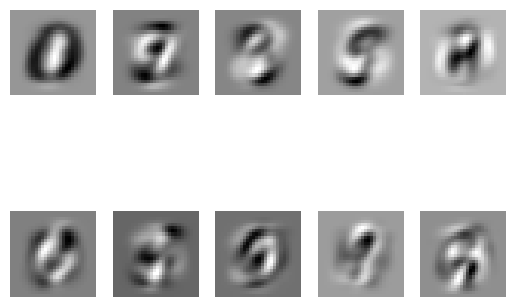

In [28]:
"""
Below, test your PCA on  MNIST dataset.
Plot and display the selected eigen vectors returned by PCA.

Use the plot_eigenvecs function provided above.
Read that function and pass arguments as needed.
"""

#begin_solution
X, Y = load_mnist_dataset(num_classes=10)
X = X / 255.0
X_mnist, X_mnist_test, Y_mnist, Y_mnist_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test
reduced_dim = 10
print(X_mnist.shape)
mean_vec, all_eig_vecs = pca(X_mnist, reduced_dim)
n_rows = 2
n_columns = 5
img_shape = (28, 28)

plot_eigenvecs(all_eig_vecs.T, n_rows, n_columns, img_shape=img_shape, channels=1)
plt.show()
#end_solution


Testing your code on _CelebA_

(95, 3072)


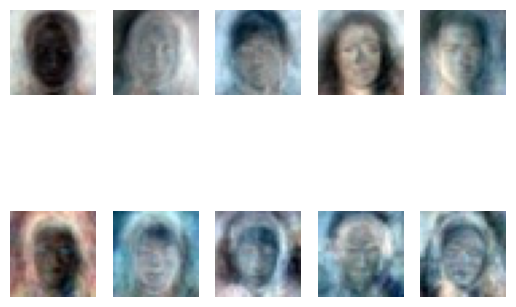

In [29]:
"""
Below, test your PCA on  CelebA dataset.
Plot and display the selected eigen vectors returned by PCA.

Use the plot_eigenvecs function provided above.
Read that function and pass arguments as needed.
"""

#begin_solution
X_CelebA,X_CelebA_test = load_face_images_array(dataset_path)
print(X_CelebA.shape)
mean_vec, all_eig_vecs = pca(X_CelebA, reduced_dim)
n_rows = 2
n_columns = 5
img_shape = X_CelebA.shape
img_shape = (32, 32)  

plot_eigenvecs(all_eig_vecs.T, n_rows, n_columns, img_shape=img_shape, channels=3)
plt.show()
#end_solution


Do not write anything in the cell below, it is for the TAs

In [30]:
#begin_test


#end_test



**Question 2b**

Now, we can evaluate if the code is working properly by projecting the first image of the test set on the eigen vectors.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>


In [31]:
def pca_projection(X, mean_vec, eig_vecs):
    """
    Write your implenetation of PCA projection here.

    Arguments:
    X : Data matrix
    mean_vec : Data mean
    eig_vecs : A numpy array where each column corresponds to an eigen vector

    Returns:
    weights : Weights corresponding to the eigen vectors
    """
    #begin_solution
    centered_data = X - mean_vec
    weights = np.dot(centered_data, eig_vecs)
    #end_solution


    return weights

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [32]:
def pca_reconstruction(weights, mean_vec, eig_vecs):
    """
    Write your implementation of PCA reconstruction here.

    Arguments:
    weights : Weights obtained from pca_projection
    mean_vec : Data mean
    eig_vecs : A numpy array where each column corresponds to an eigen vector
    """

    #begin_solution
    reconstruction = np.dot(weights, eig_vecs.T) + mean_vec
    #end_solution


    return reconstruction

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

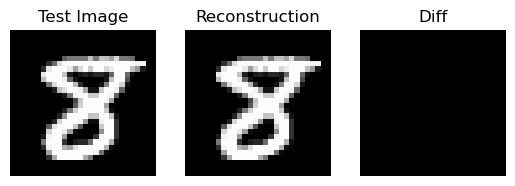

In [33]:
"""
Below,
1. Perform  PCA on MNIST training set, without reducing dimensions.
2. Project the first image of Test set to the eigen vectors using pca_projection.
3. Reconstruct that image using pca_reconstruction.
4. Display side-by-side, the Test image, its projection and the
   pixelwise difference between the two. Use the plotting functions provided.
"""

#begin_solution
test_image = X_mnist_test[0]
mean_vec, all_eig_vecs = pca(X_mnist, ndims = X_mnist.shape[1])
projection = pca_projection(test_image, mean_vec, all_eig_vecs)
reconstruction = pca_reconstruction(projection, mean_vec, all_eig_vecs)

#plot
imgs = [test_image, reconstruction, test_image - reconstruction]
titles = ["Test Image", "Reconstruction", "Diff"]
plot_images(np.vstack(imgs), n_rows=1, n_columns=3, titles=titles, num_channels=1)
#end_solution


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

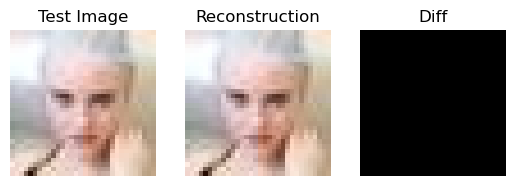

In [34]:
"""
Below,
1. Perform  PCA on CelebA training set, without reducing dimensions.
2. Project the first image of Test set to the eigen vectors using pca_projection.
3. Reconstruct that image using pca_reconstruction.
4. Display side-by-side, the Test image, its projection and the
   pixelwise difference between the two. Use the plotting functions provided.
"""

#begin_solution
test_image = X_CelebA_test[0]
mean_vec, all_eig_vecs = pca(X_CelebA, ndims = X_CelebA.shape[1])
projection = pca_projection(test_image, mean_vec, all_eig_vecs)
reconstruction = pca_reconstruction(projection, mean_vec, all_eig_vecs)

#plot
imgs = [test_image, reconstruction, test_image - reconstruction]
titles = ["Test Image", "Reconstruction", "Diff"]
plot_images(np.vstack(imgs), n_rows=1, n_columns=3, titles=titles, num_channels=3)
#end_solution


#### If your PCA reconstruction for faces is imperfect, discuss why that is the case. Edit the cell below with "Your reply" ####

_Your reply here:_

```

```

Don't write anything in the block below, its for TAs

In [35]:
#begin_test


#end_test



## 3. Linear Classification (18 points)
<a name='question3'></a>

[a)](#question3a) Implement the normal equation-based binary linear classifier lclass(examplesA, examplesB, testExamples) where the first two arguments are the set of samples from class A and class B respectively and the third is the test. The function should return a vector of 0s and 1s, 0 if test is in A and 1 otherwise. It should, for simplicity, both train and test in one function call. (**3 points**)
Test this on all the samples in _IRIS_, Setosa vs non-Setosa, and plot the confusion matrix. (**4 points** on hidden dataset)

[b)](#question3b) Extend the implementation in 3a to do multi-class classification. Implement lclass_prob(examplesA, examplesB, testExamples) and lmclass(examples, class, testExamples) that together perform multi-class classification of the examples examples according to the vector of labels class of the same size and test it with testExamples by returning a matrix, where each row expresses the probability of a sample in testExamples to belong to each class. Give the accuracy of your model. (**5 points** + **6 points** on hidden dataset)

Present findings applying multi-class classification on _IRIS_ dataset with 3 classes.

**Question 3a**
<a name='question3a'></a>

Implement Linear, binary classifier and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [36]:
def lclass(examplesA, examplesB, testExample):
    """
    Write your implementation of normal equation based linear classifier here.

    Arguments:
    examplesA : Matrix of samples from class A
    examplesB : Matrix of samples from class B
    testExample : Matrix of test samples to predict on

    Returns:
    preds : Predicted 0/1 labels on testExample
    """

    #begin_solution
     # Combine examples from both classes
    X = np.vstack((examplesA, examplesB))
    y = np.concatenate((np.zeros(examplesA.shape[0]), np.ones(examplesB.shape[0])))
    #y = np.vstack((np.zeros(examplesA.shape[0]), np.ones(examplesB.shape[0])))

    # Add a bias term to the feature matrix
    ones = np.ones((X.shape[0], 1))
    X = np.hstack((ones, X))

    # Calculate the parameter vector theta using the normal equation
    theta = np.linalg.inv(X.T @ X) @ X.T @ y

    # Add a bias term to the test examples
    ones = np.ones((testExample.shape[0], 1))
    testExample = np.hstack((ones, testExample))

    # Calculate predictions
    preds = (testExample @ theta >= 0.5).astype(int)
    #end_solution


    return preds

_IRIS_

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [37]:
"""
After implementing lclass, test it below on the IRIS dataset.
"""
#begin_solution
X, Y = load_iris_dataset(num_classes=3)
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test
X_0 = X_iris[Y_iris == 0]
X_1 = X_iris[Y_iris == 1]
y_pred = lclass(X_0, X_1, X_iris_test)
#end_solution


&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

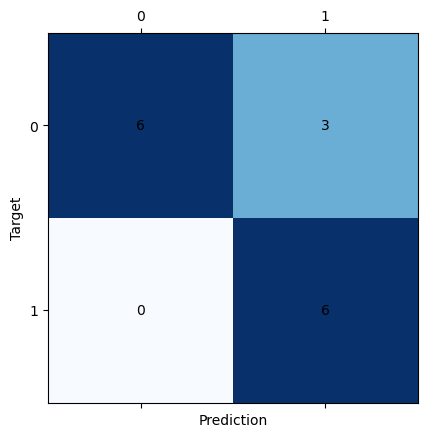

In [38]:
"""
Below, plot and display the confusion matrix of your prediction with respect to
true values. Use provided functions for plotting.
"""

#begin_solution
plot_confusion_matrix(Y_iris_test, y_pred)
#end_solution


Do not write anything in the cell below, it is for the TAs

In [39]:
#begin_test


#end_test



**Question 3b**
<a name='question3b'></a>

Implement Linear, multi-class classifier and test

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [112]:
def softmax(preds):
  """
  Write your implementation of the softmax activation here.

  Arguments:
  preds : The output predicted classes from your classifier

  Returns:
  activation : The outputs after applying softmax activation
  """

  #begin_solution
  
  exp_preds = np.exp(preds)
  activation = exp_preds / exp_preds.sum(axis=0, keepdims=True)
  #end_solution


  return activation

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [122]:
def lclass_prob(examplesA, examplesB, testExample):
    """
    Write your implementation of lclass_prob here.

    Arguments:
    examplesA : Matrix of samples from class A
    examplesB : Matrix of samples from class B
    testExample : Matrix of test samples to predict on

    Returns:
    preds : Predicted probabilities of samples in testExample belonging to a class.
    """

    #begin_solution
    # Combine examples from both classes
    X = np.vstack((examplesA, examplesB))
    y = np.concatenate((np.zeros(examplesA.shape[0]), np.ones(examplesB.shape[0])))

    # Add a bias term to the feature matrix
    ones = np.ones((X.shape[0], 1))
    X = np.hstack((ones, X))

    # Calculate the parameter vector theta using the normal equation
    theta = np.linalg.inv(X.T @ X) @ X.T @ y

    # Add a bias term to the test examples
    ones = np.ones((testExample.shape[0], 1))
    testExample = np.hstack((ones, testExample))

    # Calculate predictions
    preds = testExample @ theta.reshape(-1, 1)
    #print(preds)#十五组test数据，每行对应是第i组的概率
    
    preds = softmax(preds)
    #print(preds)#规范到一种和为1的样子
    #end_solution


    return preds

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [133]:
def lmclass(examples, labels, testExample):
    """
    Write your implementation of multiclass classifier lmclass here.
    Use your lclass_prob implementation here to solve this.

    Arguments:
    examples : The training data matrix
    labels : The training labels
    testExample : The testing data matrix

    Returns:
    preds_prob : For each sample in testExample, their predicted probabilities
                 of belonging to each class
    """

    #begin_solution
    num_classes = len(np.unique(labels))
    preds_prob = np.zeros((testExample.shape[0], num_classes))

    for class_label in range(num_classes):
        # Separate training examples into the current class and others
        examplesA = examples[labels == class_label]
        examplesB = examples[labels != class_label]
        probs = lclass_prob(examplesB, examplesA, testExample)
        preds_prob[:, class_label] = probs[:, 0] 
        
        

    #end_solution


    return preds_prob

Print the accuracy of the prediction below

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [135]:
#begin_solution
X, Y = load_iris_dataset(num_classes=3)
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

pred_prob = lmclass(X_iris, Y_iris, X_iris_test)
# Get the predicted class label for each sample
predicted_labels = np.argmax(pred_prob, axis=1)

# Calculate accuracy
correct_predictions = (predicted_labels == Y_iris_test)
accuracy = np.sum(correct_predictions) / len(Y_iris_test)

# Print the accuracy
print("Accuracy:", accuracy)
#end_solution


Accuracy: 0.8666666666666667


Do not write anything in the cell below, it is for the TAs

In [44]:
#begin_test

#end_test



## 4. Denoising (30 points)
<a name='question4'></a>

[a)](#question4a) Implement `denoiseGauss(image)` to denoise the image `noisy_image.png` under `cw_datasets/Filtering/` using a
5×5 Gaussian filter. (**5 points**)

[b)](#question4b) Implement a convolutional neural network in Pytorch to denoise an image. We provide you pairs of noisy and
noise-free image patches of size 128×128 for training and testing, under `cw_datasets/Denoising/`. You may use all the infrastructure of `Pytorch`. The network should have sufficient depth and complexity to be able to converge well.  Please use ReLU non-linearities after each layer (**20 points**).

[c)](#question4c) Given the comparison between the Gaussian-kernel denoising and the neural network denoising
methods, discuss which method performs better and why. You should write no more than 5 sentences. (**5 points**)


**Question 4a**
<a name='question4a'></a>

Implement the below functions to denoise the image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [45]:

from scipy.signal import convolve2d
def gkern(l=5, sig=1.):
    #begin_solution
    out_kernel = np.fromfunction(
        lambda x, y: (1/(2*np.pi*sig**2)) * np.exp(-((x-(l-1)/2)**2 + (y-(l-1)/2)**2)/(2*sig**2)),
        (l, l)
    )
    out_kernel = out_kernel / np.sum(out_kernel)
    #end_solution
    return out_kernel

def denoise_gauss(image):

    #begin_solution
    height, width, channels = image.shape
    gaussian_kernel = gkern()
    denoised_image = np.zeros_like(image, dtype=float)
    for channel in range(image.shape[2]):
        denoised_image[:, :, channel] = convolve2d(image[:, :, channel], gaussian_kernel, mode='same', boundary='wrap') / 255
    #end_solution

    return denoised_image

Load input image from file

In [46]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/cw_datasets/"
else:
  dataset_path = "./cw_datasets/"

noisy_image_filename = os.path.join(dataset_path,"Filtering/noisy_image.png")

Filter the input image

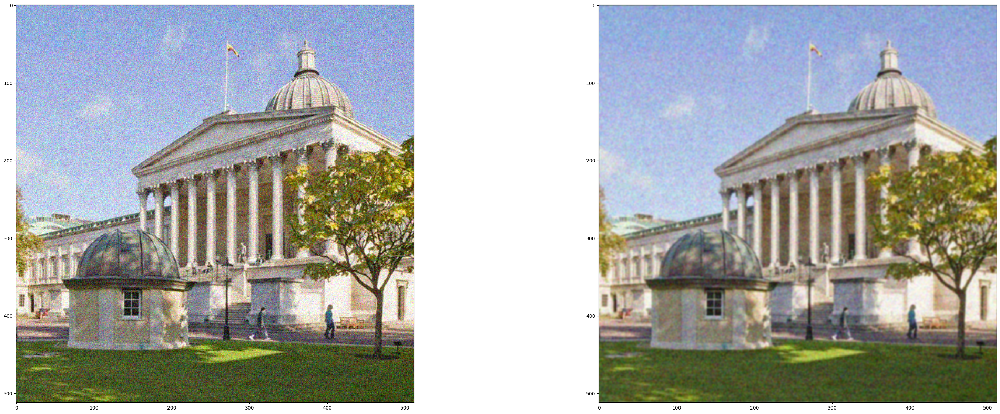

In [47]:
noisy_image = np.asarray(Image.open(noisy_image_filename).convert('RGB'))
denoised_image = denoise_gauss(noisy_image)
plot_images_horizontal([noisy_image, denoised_image])

**Question 4b**
<a name='question4b'></a>

Implement a neural denoiser using Pytorch

Implement dataset class below. Note that the images output by the `DenoisingDB` dataset should be of size 128 x 128. Crop the original images at the top left corner to get the aforementioned size.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [48]:
## import torchvision
from torchvision import transforms
class DenoisingDB(Dataset):

    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()

        #begin_solution
        self.input_imgs_path = input_imgs_path
        self.cleaned_imgs_path = cleaned_imgs_path
        self.image_size = (128, 128)

        self.input_image_files = os.listdir(input_imgs_path)
        #end_solution


    def __len__(self):
        #begin_solution
        length = len(self.input_image_files)
        #end_solution

        return length

    def __getitem__(self, idx):

        #begin_solution
        input_img_name = os.path.join(self.input_imgs_path, self.input_image_files[idx])
        cleaned_img_name = os.path.join(self.cleaned_imgs_path, self.input_image_files[idx].replace('noisy', 'clean'))

        # 打开图像
        input_img = Image.open(input_img_name).convert('RGB')
        cleaned_img = Image.open(cleaned_img_name).convert('RGB')

        # 裁剪图像至指定大小 (128 x 128)
        input_img = input_img.crop((0, 0, self.image_size[0], self.image_size[1]))
        cleaned_img = cleaned_img.crop((0, 0, self.image_size[0], self.image_size[1]))

        # 将图像转换为张量
        transform = transforms.ToTensor()
        input_img = transform(input_img)
        cleaned_img = transform(cleaned_img)
        #end_solution


        return (input_img, cleaned_img)


Implement the Denoising network:

Note that the network need to be sufficiently complex for performing the denoising task successfully. Feel free to experiment with different layers, blocks and operations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [49]:
class DenoisingCNN(nn.Module):
    def __init__(self):
        super(DenoisingCNN, self).__init__()

        #begin_solution
        # encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # 解码器部分
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 3, kernel_size=2, stride=2)
        )

        #end_solution


    def forward(self, x):

        #begin_solution
        x = self.encoder(x)
        x = self.decoder(x)
        #end_solution


        return x

# Create an instance of the network
model = DenoisingCNN()


Implement the reconstruction loss

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [50]:
import torch.nn as nn
def loss_function(prediction, target):
    """
    Calculate the Mean Squared Error (MSE) loss between the prediction and the target.

    Arguments:
    prediction : torch.Tensor
        The predicted image.
    target : torch.Tensor
        The target image for reconstruction.

    Returns:
    loss : torch.Tensor
        The computed loss.
    """

    #begin_solution
    loss = nn.MSELoss()
    #end_solution


    return loss


Paths to input data

In [51]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/cw_datasets/"
else:
  dataset_path = "./cw_datasets/"

input_imgs_path = os.path.join(dataset_path,"Denoising/input_noisy_images/")
cleaned_imgs_path = os.path.join(dataset_path,"Denoising/target_clean_images/")

Write the training loop

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [20]:
#begin_solution
optimizer = optim.Adam(model.parameters(), lr=0.001)
train_dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
num_epochs = 200 #这里设的应该太大了，感觉40这种可能更好一点儿
loss_function = nn.MSELoss()
for epoch in range(num_epochs):
    for batch in train_loader:
        noisy_images, clean_images = batch

        optimizer.zero_grad()
        outputs = model(noisy_images)
        loss = loss_function(outputs, clean_images)
        loss.backward()
        optimizer.step()
#end_solution

NameError: name 'DenoisingDB' is not defined

Save the model (needed for marking)

In [61]:
denoiser = model
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"denoiser":denoiser}, "models/denoiser.pth")

RuntimeError: File models/denoiser.pth cannot be opened.

Load trained model

In [64]:
state_dict = torch.load("models/denoiser.pth")
device = torch.device("cpu")
denoiser = state_dict["denoiser"].to(device)

Plot 5 input images and their relative denoised images side by side. Populate the 3 lists of input, gt and output with 5 images each.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

(128, 128, 3)


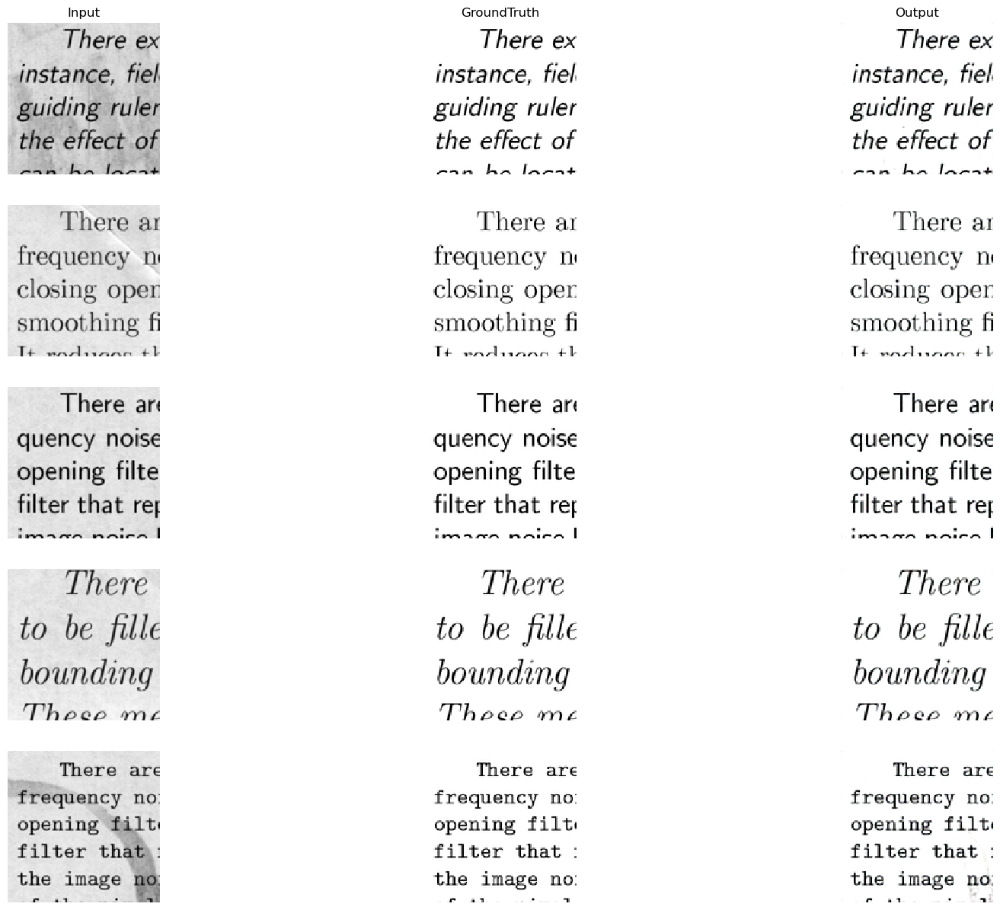

In [65]:
input_imgs, gt_imgs, output_imgs = [], [], []

#begin_solution
dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)
images = [dataset[i][0].to(device) for i in range(5)]
targets = [dataset[i][1].to(device) for i in range(5)]
# 将模型设置为评估模式
denoiser.eval()

# 对一批图像进行降噪
with torch.no_grad():
    denoised_images = [denoiser(image.unsqueeze(0)).squeeze(0).cpu().clamp(0, 1) for image in images]

# 可选：将输出的张量转换回图像格式
denoised_images_pil = [transforms.ToPILImage()(image) for image in denoised_images]
for i in range(len(images)):
    input_imgs.append(np.array(transforms.ToPILImage()(images[i].cpu())))
    gt_imgs.append(np.array(transforms.ToPILImage()(targets[i].cpu())))
    output_imgs.append(np.array(denoised_images_pil[i]))
    # input_imgs.append(images[i])
    # gt_imgs.append(targets[i])
    # output_imgs.append(denoised_images[i])
    #input_imgs[i].show()
    #output_imgs[i].show()
#end_solution

print(input_imgs[i].shape)

titles = ['Input', 'GroundTruth', 'Output']
plot_images_with_text([input_imgs, gt_imgs, output_imgs],titles,texts=None)


Compute images for both the AE and Gaussian Kernels algorithm from `images`.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [66]:
dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)

images = [dataset[i][0].to(device) for i in range(5)]
targets = [dataset[i][1].to(device) for i in range(5)]
images_ae = []
images_gauss = []

#begin_solution
denoiser.eval()
transform = transforms.ToTensor()
# 对一批图像进行降噪
with torch.no_grad():
    denoised_images = [denoiser(image.unsqueeze(0)).squeeze(0).cpu().clamp(0, 1) for image in images]
# 可选：将输出的张量转换回图像格式
denoised_images_pil = [transforms.ToPILImage()(image) for image in denoised_images]
images_origin = [transforms.ToPILImage()(image) for image in images]
for i in range(len(images)):
    temp_ae = np.array(denoised_images_pil[i])
    images_ae.append(temp_ae)
    temp_gauss = denoise_gauss(np.array(images_origin[i])).astype(np.float32)
    images_gauss.append(temp_gauss)
    print(images_ae[0].shape)
    print(images_gauss[0].shape)


#end_solution


(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)
(128, 128, 3)


Now we plot images and PSNR, to compare the two methods

In [58]:
#这里我改过了，加了imgs_plot[i].transpose(1, 2, 0)，否则原来的代码shape是(3, 128, 128)没法和images_ae使用peak_signal_noise_ratio
# 而若将images_ae 改成(3, 128, 128，就没法放到peak_signal_noise_ratio里面
imgs_plot = [ el.detach().squeeze().cpu().numpy() for el in images]
for i in range(len(imgs_plot)):
    imgs_plot[i] = imgs_plot[i].transpose(1, 2, 0)
tgts_plot = [ el.detach().squeeze().cpu().numpy() for el in targets]
for i in range(len(tgts_plot)):
    tgts_plot[i] = tgts_plot[i].transpose(1, 2, 0)
print(tgts_plot[0].shape)

(128, 128, 3)


C:\Users\86189\AppData\Local\Temp\ipykernel_14984\2476473164.py:3: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_ae    = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])


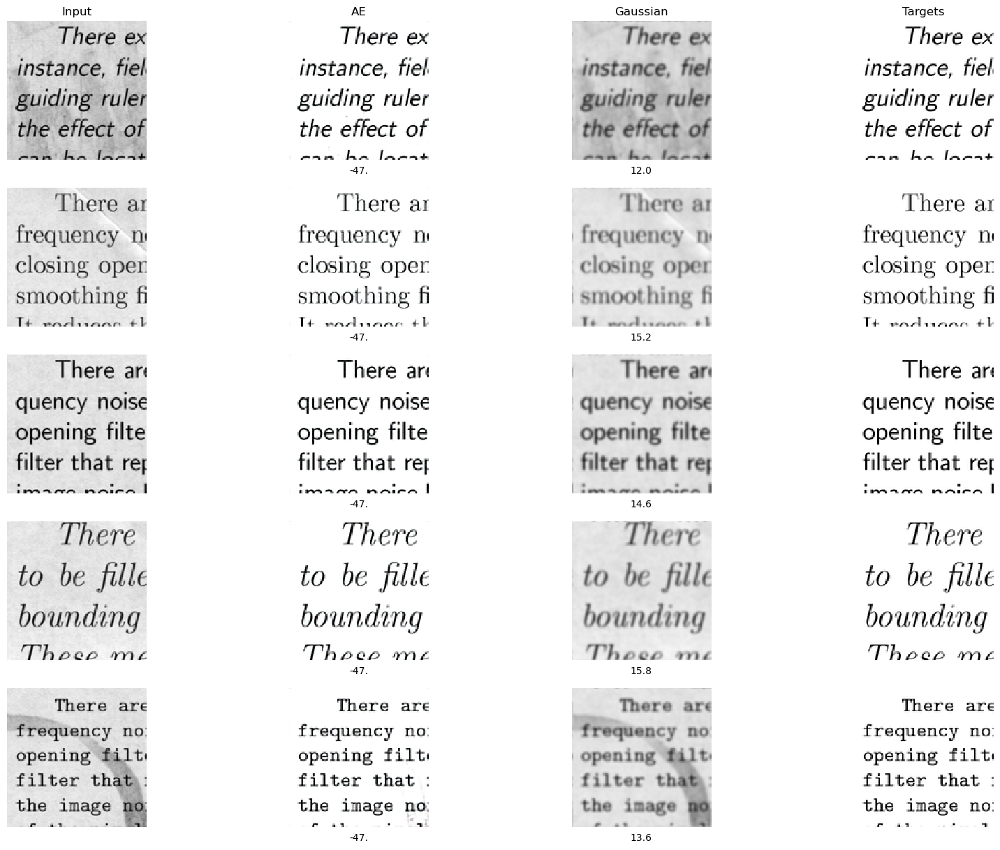

In [67]:
psnrs = [ 0.0 for el in targets ]
for i in range(len(tgts_plot)):
    psnr_ae    = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])
    pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])
    psnrs[i] = ['', psnr_ae, pnsr_gauss, '']

img = [imgs_plot, images_ae, images_gauss, tgts_plot]
titles = ['Input', 'AE', 'Gaussian', 'Targets']
texts = psnrs
plot_images_with_text(img, titles, texts)
plt.show()

**Question 4c**
<a name="question4c"></a>

#### Discuss which method performs better, and why, edit the cell below with "Your reply" ####

_Your reply here:_

## 5. Implicit Neural Representation (30 points)
The objective here is to learn an implicit neural function to predict frames of an animated 2D object. That is, learn a function $f(x,y,t; \theta)$, where $\theta$ are learnable MLP weights, that takes as input pixel coordinates $x,y$ and time $t$ and predicts the pixel value at that location and time. The learned function should then be able to generate frames of the video at any given instance $t$. The task is divided into multiple incremental blocks as below:

[a)](#question5a) Fit an MLP model to a _single_ image. **(5 points)**

[b)](#question5b) Add positional encoding of pixels to improve prediction. **(5 points)**

[c)](#question5c) Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. **(8 points)**

[d)](#question5d) Fit the MLP to the sequence of frames with and without positional encoding on time, and report the result for both **(2 points)**

[e)](#question5e) Implement batching, to prevent memory issues when evaluating large number of pixels with the MLP. Size of a batch should not exceed 16000 **(5 points)**

[f)](#question5f) Generate a video of 100 frames uniformly sampled between the first and last frame. Since you trained on only 11 frames, by generating 100 frames you're interpolating unseen video frames. If your method works correctly, it should produce a continuous motion. If you overfit on the training frames, then it would give a discontinuous or jagged motion **(5 points)**


**Let's Prepare the animation inputs**

In [3]:
#!wget 'https://upload.wikimedia.org/wikipedia/commons/0/07/The_Horse_in_Motion-anim.gif'

X = np.zeros((11,230,340),dtype=np.uint8)
with imageio.get_reader('The_Horse_in_Motion-anim.gif') as r:
    for i in range(11):
        X[i] = r.get_data(i)
        X[i,0:20] = 255
        X[i,200:] = 255
        X[i,:,300:] = 255
        X[i,:,:10] = 255

X_resized = np.stack([cv2.resize(X[k], (128,128), cv2.INTER_AREA) for k in range(X.shape[0])], axis=0)
for i in range(X_resized.shape[0]):
  X_resized[i] = np.where(X_resized[i]>60,0,1)

print(X_resized.shape)

(11, 128, 128)


Let's visualize the frames:

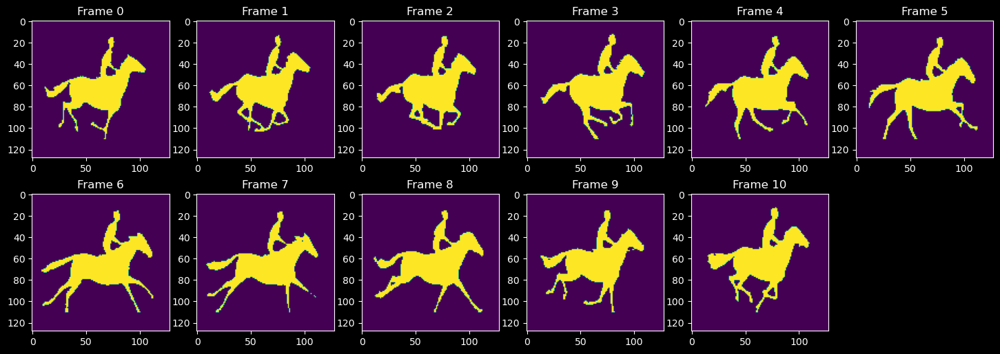

In [4]:
plt.figure(figsize=(6*3,2*3))
for i in range(11):
    plt.subplot(2,6,i+1)
    plt.imshow(X_resized[i])
    plt.title(f'Frame {i}')
plt.show()
plt.close()

Save the frames as a video sequence

In [2]:
output_path = 'input_bw_video.mp4'
with imageio.get_writer(output_path, mode='I', fps=10) as writer:
        for k in range(X_resized.shape[0]):
            writer.append_data(255*X_resized[k])
Video(output_path)

Visualization util method

In [18]:
def plot_implicit_representation_single_image(image, model, device='cuda'):

    '''
    Visualize implicit representation of image from training the MLP model

    Args:
        - image TORCHFLOAT32 (H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_image(image, model, device=device)
    U = U.reshape((1,image.shape[0],image.shape[1]))
    U_bw = (U>0.5).type(torch.int32).cpu()

    plt.figure(figsize=(12,6))

    plt.subplot(1,3,1)
    plt.title('Implicit rep.')
    plt.imshow(U[0].cpu().numpy())
    plt.colorbar()
    plt.clim(0,1)

    plt.subplot(1,3,2)
    plt.imshow(U_bw[0].cpu().numpy())
    plt.title('Prediction')

    plt.subplot(1,3,3)
    plt.imshow(image.cpu())
    plt.title('Ground truth')

def plot_implicit_representation_multi_images(images, model, device='cuda'):

    '''
    Visualize implicit representation of a set of images from training the MLP model

    Args:
        - images TORCHFLOAT32 (N,H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_images(images, model, device=device)
    U = U.reshape((images.shape[0],images.shape[1],images.shape[2])).cpu()
    U_bw = (U>0.5).type(torch.int32).cpu()

    for i in range(images.shape[0]):

        plt.figure(figsize=(12,6))

        plt.subplot(1,3,1)
        plt.title('Implicit rep.')
        plt.imshow(U[i].cpu().numpy())
        plt.colorbar()
        plt.clim(0,1)

        plt.subplot(1,3,2)
        plt.imshow(U_bw[i].cpu().numpy())
        plt.title('Prediction')

        plt.subplot(1,3,3)
        plt.imshow(images[i].cpu())
        plt.title(f'Ground truth Frame {i}')

def plot_loss_and_accuracy(loss_list,accuracy_list):
    plt.figure(figsize=(8*2,6))

    plt.subplot(1,2,1)
    plt.plot([x[0] for x in loss_list], [x[1] for x in loss_list])
    plt.title('Training loss')
    plt.xlabel('epochs')

    plt.subplot(1,2,2)
    plt.plot([x[0] for x in accuracy_list], [x[1] for x in accuracy_list])
    plt.title('Accuracy')
    plt.ylim(0.,1.)
    plt.xlabel('epochs')

**Question 5a**
<a name='question5a'></a>

Fit an MLP model to a single image

Below, write a MLP model which takes as input a pixel position (x,y) and return a pixel value prediction $p_{x,y}$

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [4]:
class MLP(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension):
        super(MLP, self).__init__()

        #begin_solution
        #Map the input into a low-dimensional feature space
        self.embedding = nn.Sequential(
            nn.Linear(input_dimension, embedding_dimension),
            nn.ReLU()
        )
        #define layers: ModuleList consisting of multiple hidden layers
        self.layers = nn.ModuleList([
            nn.Sequential(
                nn.Linear(embedding_dimension, embedding_dimension),
                nn.ReLU()
            ) for _ in range(nb_layers)
        ])
        self.output_layer = nn.Linear(embedding_dimension, output_dimension)
        #end_solution


    def forward(self, input):
        #begin_solution
        x = self.embedding(input)
        for layer in self.layers:
            x = layer(x)
        prediction = self.output_layer(x)
        return prediction
        #end_solution

        return prediction

Write a function which samples random pixel positions in an image

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [9]:
## Sample random pixel positions
def sample_image(image, n, scaled=True):
  '''
  Args:
    - image TORCHINT32 (H, W)
    - n : int, number of positions to sample
    - scaled: bool, if True, divide by the dimension
  Returns:
    - sampled_positions TORCHFLOAT32 ((n,2)), sampled positions
    - pixel_values TORCHINT32((n,)), sampled pixel values
  '''

  #begin_solution
  h, w = image.shape
  #Randomly generate n integers in [0, H) and [0, W)
  sampled_rows = torch.randint(0, h, (n,))
  sampled_cols = torch.randint(0, w, (n,))
  sampled_positions = torch.stack((sampled_rows, sampled_cols), dim=1)
  
  pixel_values = image[sampled_rows, sampled_cols]
  
  # normalize
  if scaled:
      sampled_positions = sampled_positions.float() / torch.tensor([h, w])
  #end_solution


  return sampled_positions, pixel_values

Write a function that takes and image and a trained MLP and predicts all pixel values of the image. That is, for every $x,y$ in the given image, predict its pixel value with the MLP.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [24]:
def predict_image(image, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (H, W)
    - model, takes as input a batch of pixel positions and return pixel value
  Return:
    - prediction TORCHFLOAT32 (H, W) [CPU]
  '''
  #begin_solution
  h, w = image.shape
  #Generate a tensor of (h, w, 2) representing the coordinates of all pixel locations
  rows = torch.arange(0, h, dtype=torch.float32)
  cols = torch.arange(0, w, dtype=torch.float32)
  grid_rows, grid_cols = torch.meshgrid(rows, cols)
  positions = torch.stack((grid_rows, grid_cols), dim=-1)
  
  #normalize
  if scale:
      positions = positions / torch.tensor([h, w], dtype=torch.float32)
      
  # flatten to (h*w, 2) and pass it to the device
  positions = positions.view(-1, 2).to(device)
  
  #predict
  model = model.to(device)
  with torch.no_grad():
      predictions = model(positions)
  prediction = predictions.view(h, w).cpu()
  #end_solution

  #print(prediction)
  return prediction

Write a function to evaluate the model's prediction performance

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [26]:
## Compute accuracy over the set of frames
def eval_accuracy(image, model, device='cuda'):
  '''
  Args:
    - images TORCH_INT32 (H, W)
    - model, takes as input a batch of pixel positions and return pixel value
  Return:
    - mean_accuracy FLOAT32
  '''

  #begin_solution
  predicted_image = predict_image(image, model, device)
  #mse = torch.nn.functional.mse_loss(predicted_image, image.float())
  #accuracy = 1 - mse / image.float().max()
  predicted_image = (predicted_image > 0.5).float()
  
  # compare 2 images pixel by pixel
  accuracy = (predicted_image == image.float()).float().mean().item()
  #end_solution


  return accuracy

Write the training loop. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [30]:
loss_list, accuracy_list = [], []

#begin_solution
#define training`s parameters
num_epochs=10000
learning_rate=0.001
device = torch.device("cpu") # my laptop can`t use cuda
X_tensor = torch.tensor(X_resized[0], dtype=torch.float32).to(device)
    
# Move model to device
model = MLP(input_dimension = 2, nb_layers = 3, embedding_dimension = 50, output_dimension = 1)
model = model.to(device)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    #pick n random pixels
    positions, values = sample_image(X_tensor, n=1000, scaled=True)
    
    # Forward pass
    predictions = model(positions)
    loss = criterion(predictions.squeeze(), values)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Calculate loss & accuracy
    loss_list.append((epoch, loss.item()))
    accuracy = eval_accuracy(X_tensor, model, device)
    accuracy_list.append((epoch, accuracy))
    
    # Print progress
    if (epoch + 1) % 100 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}, Accuracy: {accuracy:.4f}')
#end_solution


Epoch [100/10000], Loss: 0.0802, Accuracy: 0.8677
Epoch [200/10000], Loss: 0.0452, Accuracy: 0.9340
Epoch [300/10000], Loss: 0.0478, Accuracy: 0.9385
Epoch [400/10000], Loss: 0.0395, Accuracy: 0.9376
Epoch [500/10000], Loss: 0.0405, Accuracy: 0.9406
Epoch [600/10000], Loss: 0.0379, Accuracy: 0.9409
Epoch [700/10000], Loss: 0.0379, Accuracy: 0.9467
Epoch [800/10000], Loss: 0.0417, Accuracy: 0.9470
Epoch [900/10000], Loss: 0.0325, Accuracy: 0.9512
Epoch [1000/10000], Loss: 0.0303, Accuracy: 0.9566
Epoch [1100/10000], Loss: 0.0289, Accuracy: 0.9590
Epoch [1200/10000], Loss: 0.0282, Accuracy: 0.9615
Epoch [1300/10000], Loss: 0.0235, Accuracy: 0.9648
Epoch [1400/10000], Loss: 0.0300, Accuracy: 0.9649
Epoch [1500/10000], Loss: 0.0211, Accuracy: 0.9680
Epoch [1600/10000], Loss: 0.0261, Accuracy: 0.9695
Epoch [1700/10000], Loss: 0.0328, Accuracy: 0.9677
Epoch [1800/10000], Loss: 0.0240, Accuracy: 0.9706
Epoch [1900/10000], Loss: 0.0221, Accuracy: 0.9688
Epoch [2000/10000], Loss: 0.0254, Accura

Save the model (needed for marking)

In [31]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image.pth")

Load the trained model

In [32]:
state_dict = torch.load("models/implicit_single_image.pth")
model = state_dict["model"].to(device)

Let's plot our performance

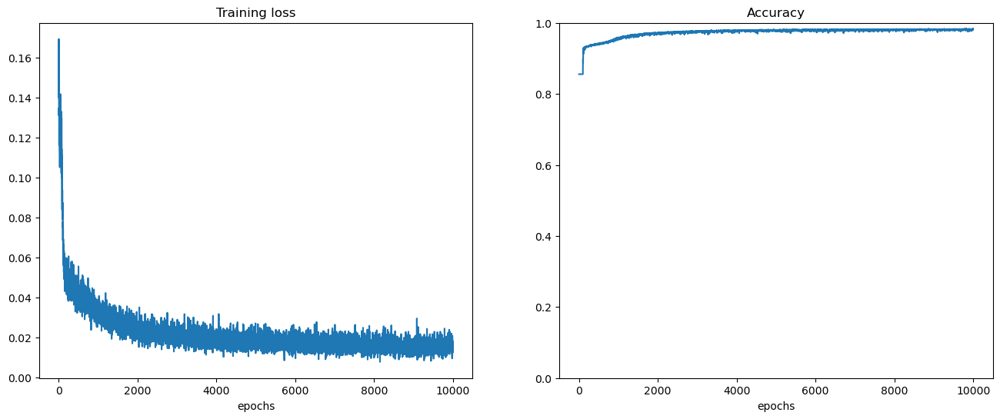

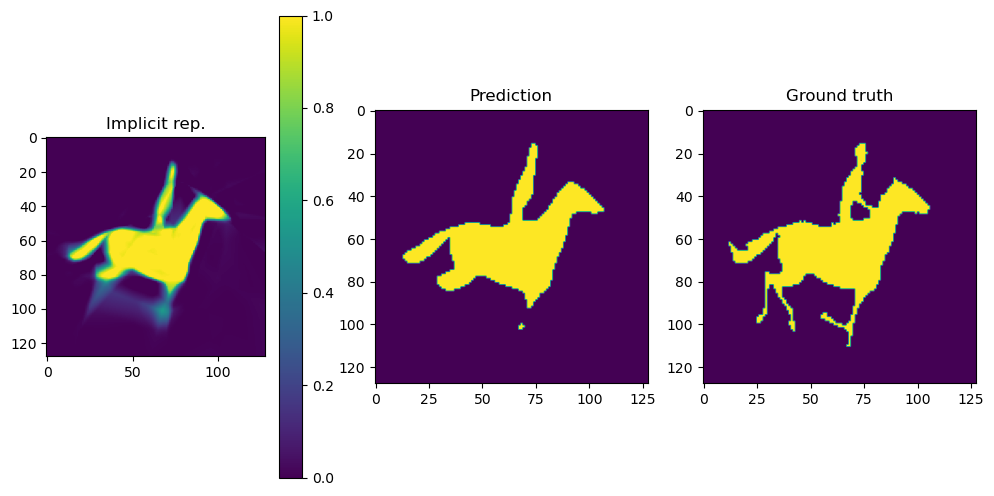

In [33]:
image = torch.tensor(X_resized[0], dtype=torch.float32)
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image, model, device=torch.device("cpu"))

**Question 5b**
<a name='question5b'></a>

Add positional encoding of pixels to improve predictions.

Write a function that positionally encodes the input.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [35]:
def positional_embedding_power_ls(X,L, cst=torch.pi):
    #begin_solution
    n, _ = X.shape
    frequencies = 2 ** torch.arange(0, L, dtype=torch.float32)  # shape (L,)
    
    # calculate cosine and sine encoding
    cos_encoding = torch.cos(cst * X.unsqueeze(-1) * frequencies.unsqueeze(0))  # shape (n, 2, L)
    sin_encoding = torch.sin(cst * X.unsqueeze(-1) * frequencies.unsqueeze(0))  # shape (n, 2, L)
    
    cos_encoding = cos_encoding.view(n, -1)  # shape (n, 2L)
    sin_encoding = sin_encoding.view(n, -1)  # shape (n, 2L)
    #end_solution

    return torch.cat([cos_encoding,sin_encoding], axis=-1)

Write a new MLP, while reusing the previous MLP model, that can predict using the positionally encoded pixel locations.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [56]:
class MLP_PE(nn.Module):
    '''
    MLP with positional encoding class
    '''
    def __init__(self, input_dimension, nb_layers, embedding_dimension, output_dimension, positional_enc_L=0):
        super(MLP_PE, self).__init__()
        #begin_solution
        # Map each position of the input data to a positional encoding
        self.positional_embedding = nn.Linear(input_dimension, positional_enc_L)
        #The dimension of the positional_embedding_power_ls return is 2L + 2L)
        self.mlp = MLP(input_dimension + 4 * positional_enc_L, nb_layers, embedding_dimension, output_dimension)
        #end_solution

    def forward(self, input):
        #begin_solution
        # Encode each position of the input data
        position = positional_embedding_power_ls(input, self.positional_embedding.out_features)
        input_with_position = torch.cat((input, position), dim=-1)
        prediction = self.mlp(input_with_position)
        #end_solution

        return prediction


Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

In [57]:
loss_list, accuracy_list = [], []

#begin_solution
model = MLP_PE(input_dimension = 2, nb_layers = 3, embedding_dimension = 50, output_dimension = 1, positional_enc_L = 10)
model = model.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

for epoch in range(num_epochs):
    # Sample random pixel positions and values
    positions, values = sample_image(X_tensor, n=1000, scaled=True)
    
    # Forward pass
    predictions = model(positions)
    loss = criterion(predictions.squeeze(), values)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Calculate accuracy
    accuracy = eval_accuracy(X_tensor, model, device)
    
    # Append loss and accuracy to lists
    loss_list.append((epoch, loss.item()))
    accuracy_list.append((epoch, accuracy))
    
    # Print progress
    if (epoch + 1) % 1000 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}, Accuracy: {accuracy:.4f}')
#end_solution


Epoch [1000/10000], Loss: 0.0012, Accuracy: 0.9987
Epoch [2000/10000], Loss: 0.0000, Accuracy: 0.9999
Epoch [3000/10000], Loss: 0.0000, Accuracy: 0.9999
Epoch [4000/10000], Loss: 0.0021, Accuracy: 0.9979
Epoch [5000/10000], Loss: 0.0000, Accuracy: 0.9999
Epoch [6000/10000], Loss: 0.0000, Accuracy: 0.9999
Epoch [7000/10000], Loss: 0.0000, Accuracy: 0.9999
Epoch [8000/10000], Loss: 0.0000, Accuracy: 0.9999
Epoch [9000/10000], Loss: 0.0000, Accuracy: 1.0000
Epoch [10000/10000], Loss: 0.0000, Accuracy: 1.0000


Save the model (needed for marking)

In [58]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image_positional_encoding.pth")

Load the trained model

In [59]:
state_dict = torch.load("models/implicit_single_image_positional_encoding.pth")
model = state_dict["model"].to(device)

Let's plot our performance.

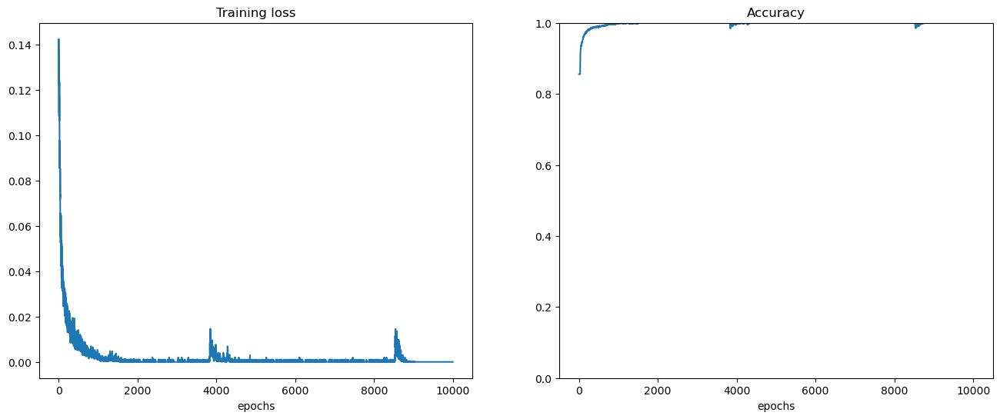

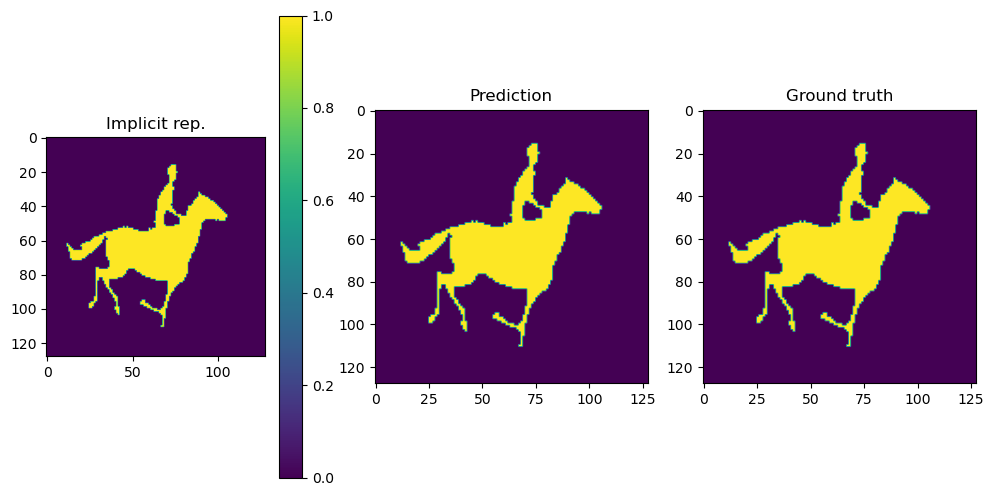

In [61]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image, model, device=device)

**Question 5c**
<a name='question5c'></a>

Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. You'd need to rewrite image sampling and other functions to achieve this.

Write a function that can now also sample across the time dimension.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [5]:
def sample_images(images, n, scaled=True):
  '''
  Args:
    - images TORCHINT32 (N_frames, H, W)
    - n : int, number of positions to sample
    - scaled: bool, if True, divide by the dimension
  Returns:
    - sampled_positions TORCHFLOAT32 ((n,3)), sampled positions
    - pixel_values TORCHINT32((n,)), sampled pixel values
  '''

  #begin_solution
  N_framse, h, w = images.shape
  #Randomly generate n integers in [0, H) and [0, W)
  smapled_frames = torch.randint(0, N_framse, (n,))
  sampled_rows = torch.randint(0, h, (n,))
  sampled_cols = torch.randint(0, w, (n,))
  sampled_positions = torch.stack((smapled_frames, sampled_rows, sampled_cols), dim=1)
  
  pixel_values = images[smapled_frames, sampled_rows, sampled_cols]
  
  # normalize
  if scaled:
      sampled_positions = sampled_positions.float() / torch.tensor([N_framse, h, w])
  #end_solution

  return sampled_positions, pixel_values


Write a function to predict the images, now also across time.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [6]:
def predict_images(images, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
  '''
  #begin_solution
  N_frames, h, w = images.shape
  #Generate a tensor of (h, w, 2) representing the coordinates of all pixel locations
  frames = torch.arange(0, N_frames, dtype=torch.float32)
  rows = torch.arange(0, h, dtype=torch.float32)
  cols = torch.arange(0, w, dtype=torch.float32)
  grid_frames, grid_rows, grid_cols = torch.meshgrid(frames, rows, cols)
  positions = torch.stack((grid_frames, grid_rows, grid_cols), dim=-1)
  
  #normalize
  if scale:
      positions = positions / torch.tensor([N_frames, h, w], dtype=torch.float32)
      
  # flatten to (N_frames * h * w, 3) and pass it to the device
  positions = positions.view(-1, 3).to(device)
  
  #predict
  model = model.to(device)
  with torch.no_grad():
      predictions = model(positions)
  prediction = predictions.view(N_frames, h, w).cpu()
  #end_solution


  return prediction

Write a function to evaluate performance across time.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [7]:
## Compute accuracy over the set of frames
def eval_mean_accuracy(images, model, device='cuda'):
  '''
  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - mean_accuracy FLOAT32
  '''
  #begin_solution
  predicted_images = predict_images(images, model, device)
  #mse = torch.nn.functional.mse_loss(predicted_image, image.float())
  #accuracy = 1 - mse / image.float().max()
  predicted_images = (predicted_images > 0.5).float()
  
  # compare 2 anims pixel by pixel
  accuracy = (predicted_images == images.float()).float().mean().item()
  #end_solution


  return accuracy

Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [8]:
loss_list, accuracy_list = [], []

#begin_solution
#define training`s parameters
num_epochs=5000
learning_rate=0.001
device = torch.device("cpu") # my laptop can`t use cuda
X_tensor = torch.tensor(X_resized, dtype=torch.float32).to(device)
    
# Move model to device
model = MLP(input_dimension = 3, nb_layers = 3, embedding_dimension = 50, output_dimension = 1)
model = model.to(device)

# Define loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Training loop
for epoch in range(num_epochs):
    #pick n random data points
    positions, values = sample_images(X_tensor, n=1000, scaled=True)
    
    # Forward pass
    predictions = model(positions)
    loss = criterion(predictions.squeeze(), values)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    # Calculate loss & accuracy
    loss_list.append((epoch, loss.item()))
    accuracy = eval_mean_accuracy(X_tensor, model, device)
    accuracy_list.append((epoch, accuracy))
    
    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}, Accuracy: {accuracy:.4f}')
#end_solution


d:\Anaconda\envs\godzilla\Lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\b\abs_abjetg6_iu\croot\pytorch_1686932924616\work\aten\src\ATen\native\TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Epoch [10/5000], Loss: 0.1569, Accuracy: 0.8401
Epoch [20/5000], Loss: 0.1394, Accuracy: 0.8401
Epoch [30/5000], Loss: 0.1251, Accuracy: 0.8401
Epoch [40/5000], Loss: 0.1280, Accuracy: 0.8401
Epoch [50/5000], Loss: 0.1400, Accuracy: 0.8401
Epoch [60/5000], Loss: 0.1295, Accuracy: 0.8401
Epoch [70/5000], Loss: 0.1189, Accuracy: 0.8401
Epoch [80/5000], Loss: 0.1130, Accuracy: 0.8401
Epoch [90/5000], Loss: 0.1136, Accuracy: 0.8401
Epoch [100/5000], Loss: 0.0904, Accuracy: 0.8401
Epoch [110/5000], Loss: 0.0850, Accuracy: 0.8914
Epoch [120/5000], Loss: 0.0900, Accuracy: 0.9086
Epoch [130/5000], Loss: 0.0766, Accuracy: 0.9025
Epoch [140/5000], Loss: 0.0717, Accuracy: 0.9112
Epoch [150/5000], Loss: 0.0717, Accuracy: 0.9155
Epoch [160/5000], Loss: 0.0768, Accuracy: 0.9189
Epoch [170/5000], Loss: 0.0785, Accuracy: 0.9166
Epoch [180/5000], Loss: 0.0699, Accuracy: 0.9135
Epoch [190/5000], Loss: 0.0641, Accuracy: 0.9191
Epoch [200/5000], Loss: 0.0636, Accuracy: 0.9173
Epoch [210/5000], Loss: 0.062

Save the model (needed for marking)

In [9]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_images_sequence.pth")

Load the trained model

In [10]:
state_dict = torch.load("models/implicit_images_sequence.pth")
model = state_dict["model"].to(device)

Let's plot our performance

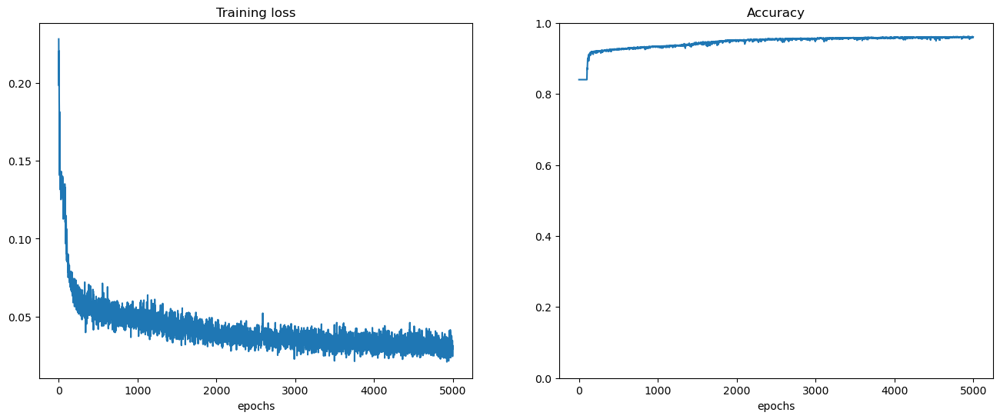

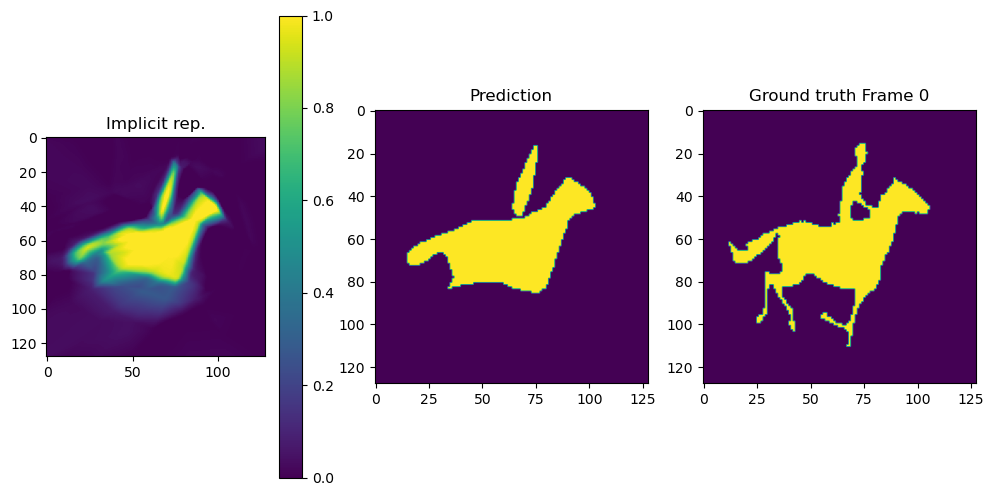

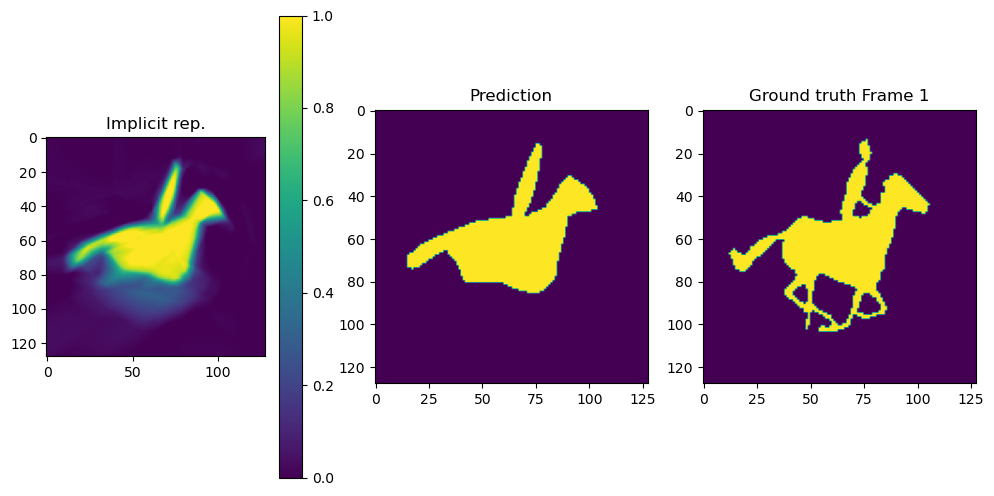

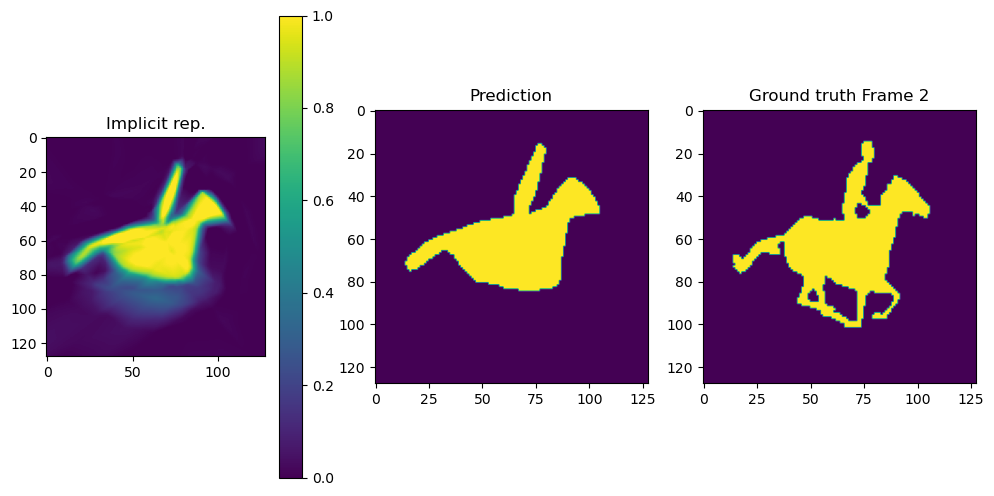

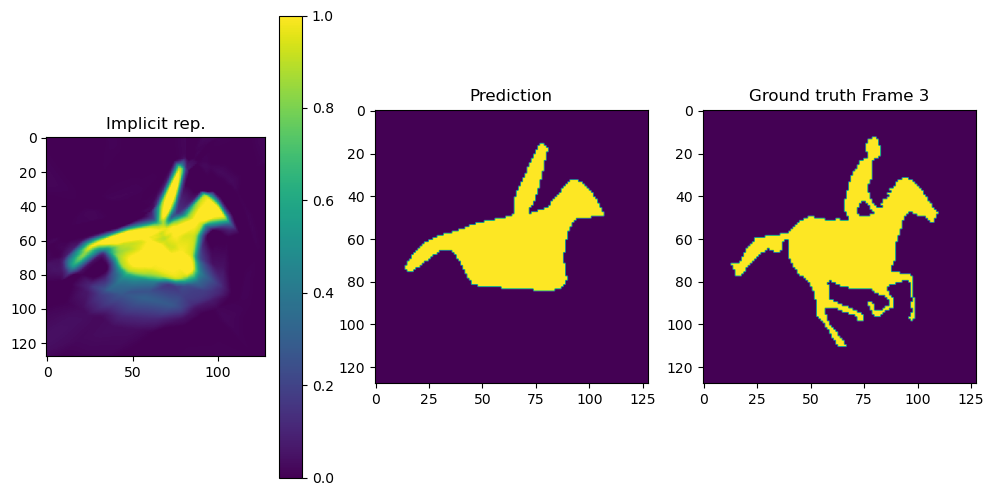

...

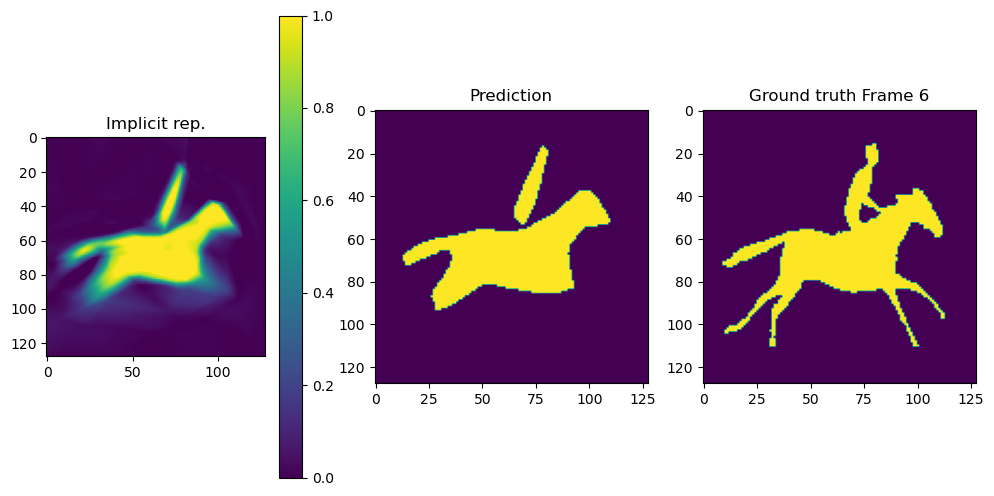

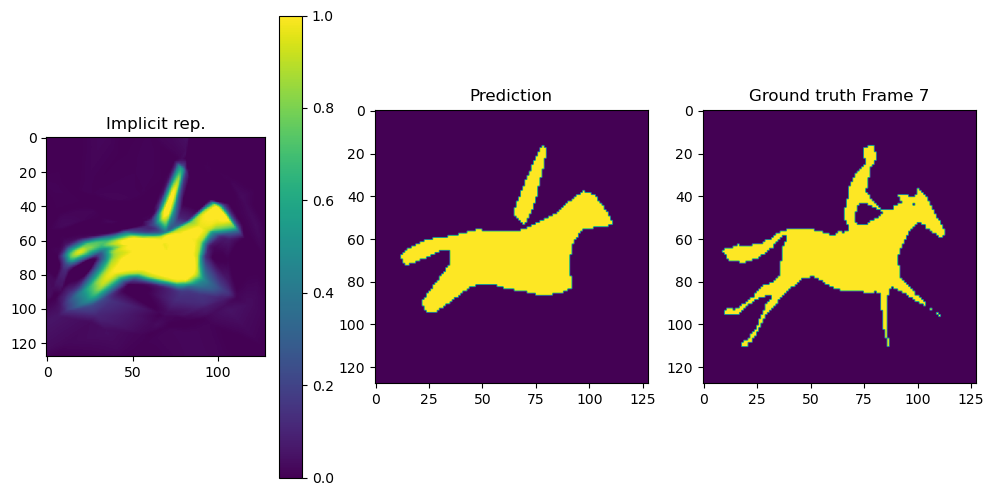

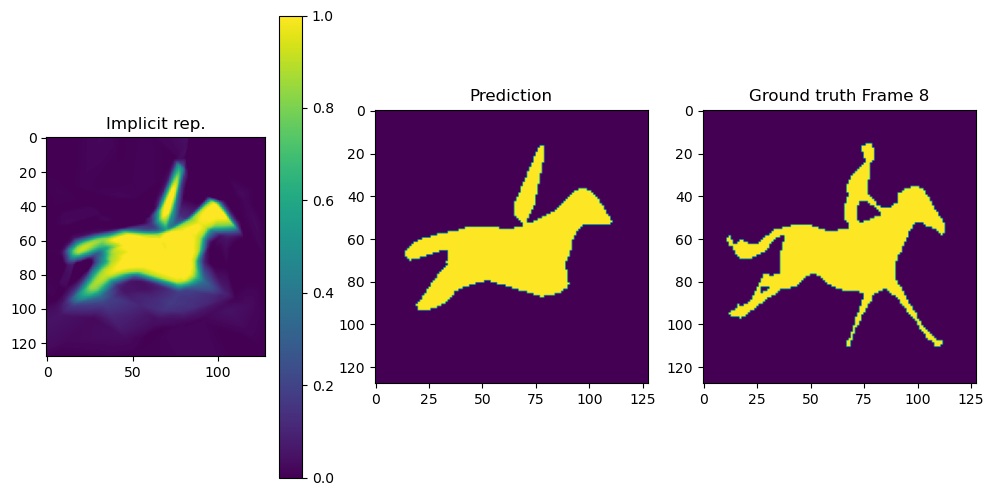

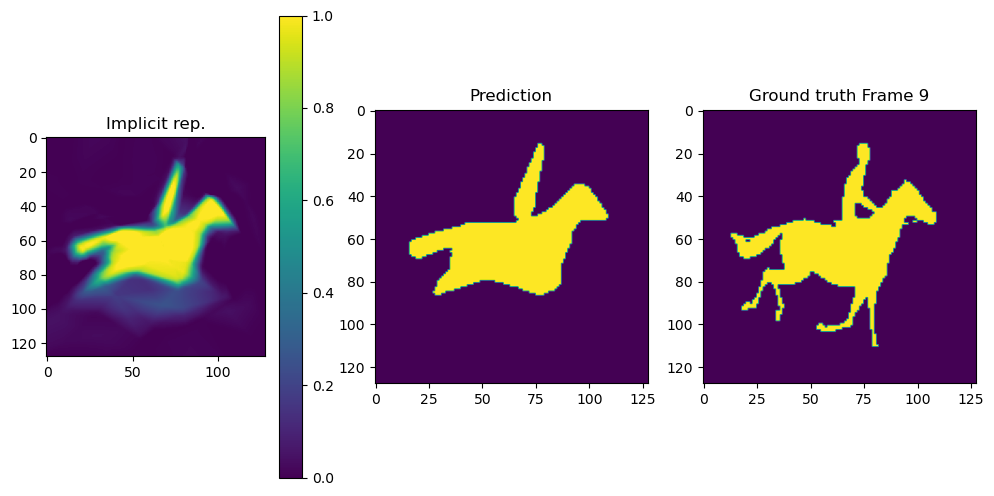

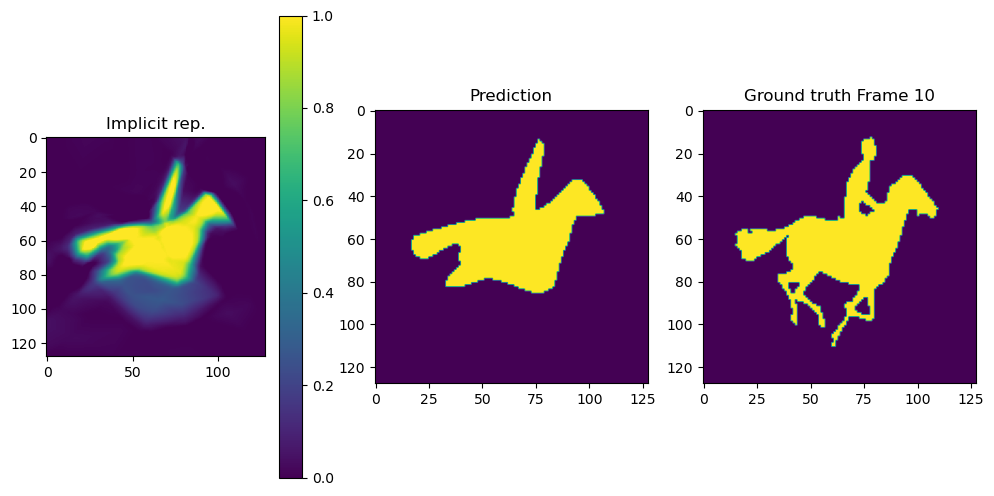

In [19]:
plot_loss_and_accuracy(loss_list,accuracy_list)
#images = X_tensor
images = torch.tensor(X_resized, dtype = torch.float32)
plot_implicit_representation_multi_images(images, model, device=device)

**Question 5d**
<a name='question5d'></a>

Apply positional encoding for the time dimension.

Write a function that positionally encodes time values, with an optional flag to enable or disable it.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [54]:
def positional_embedding_power_ls(X,L, cst=torch.pi, encode_time_dimension=True):
    #begin_solution
    if False == encode_time_dimension:
        return
    n, d = X.shape  # assuming X is of shape (time_dimension, other_dimensions)
    frequencies = 2 ** torch.arange(0, L, dtype=torch.float32)  # shape (L,)

    # Separate time dimension and other dimensions
    time_dim = X[:, 0].unsqueeze(1)  # Shape (n, 1)
    other_dims = X[:, 1:]  # Shape (n, d - 1)

    # Calculate positional encoding for time dimension
    if encode_time_dimension:
        time_frequencies = cst * time_dim * frequencies.unsqueeze(0)  # shape (n, L)
        cos_time_encoding = torch.cos(time_frequencies).view(n, -1)  # shape (n, L)
        sin_time_encoding = torch.sin(time_frequencies).view(n, -1)  # shape (n, L)
        time_encoding = torch.cat([cos_time_encoding, sin_time_encoding], dim=-1)  # shape (n, 2L)
    else:
        time_encoding = torch.zeros(n, 2 * L)  # If not encoding time, fill with zeros

    # Calculate positional encoding for other dimensions
    expanded_dims = cst * other_dims.unsqueeze(-1) * frequencies.unsqueeze(0)  # shape (n, d-1, L)
    cos_encoding = torch.cos(expanded_dims).view(n, -1)  # shape (n, (d-1)*L)
    sin_encoding = torch.sin(expanded_dims).view(n, -1)  # shape (n, (d-1)*L)
    spatial_encoding = torch.cat([cos_encoding, sin_encoding], dim=-1)  # shape (n, 2*(d-1)*L)

    # Concatenate time encoding and spatial encoding
    encoding = torch.cat([time_encoding, spatial_encoding], dim=-1)  # shape (n, 2*d*L)
    #end_solution

    return encoding

Write a new MLP, while re-using the previous one, that now predicts using the positionally encoded time. It should also predict without positional encoding, for comparison.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [59]:
class MLP_PE_time_option(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension,
                 positional_enc_L=0,encode_time_dimension=True):
        super(MLP_PE_time_option, self).__init__()
        #begin_solution       
        self.encode_time_dimension = encode_time_dimension
        self.positional_enc_L = positional_enc_L
        if encode_time_dimension:
            
            #self.position_embedding = nn.Linear(input_dimension, positional_enc_L)
            
            self.mlp = MLP(input_dimension + 2 * positional_enc_L * input_dimension, nb_layers, embedding_dimension, output_dimension)
            self.encode_time_dimension = encode_time_dimension
            self.positional_enc_L = positional_enc_L  # 保存位置编码长度
        else:
            self.mlp = MLP(input_dimension, nb_layers, embedding_dimension, output_dimension)
        #end_solution


    def forward(self, input):
        #begin_solution
        if self.encode_time_dimension:
            #position = positional_embedding_power_ls(input, self.positional_embedding.out_features)
            
            position = positional_embedding_power_ls(input, self.positional_enc_L)
            input_with_position = torch.cat((input, position), dim=-1)
            prediction = self.mlp(input_with_position)
        else:
            prediction = self.mlp(input)
        #end_solution

        return prediction


Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list. These lists can be used for plotting later.

Note that this time, the two lists are nested. Each list should contain two sub-lists, one with Positional Encoding turned ON and other with Positional Encoding turned oFF. Each sub-list, similar to before, has scalar loss/acurracy values in each epoch.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [63]:
loss_list, accuracy_list = [[],[]], [[],[]]
# Assign your model to these variables depending on whether they have time encoding or not.
# We'll save these models to disk later
mlp_model_with_time_encoding = MLP_PE_time_option(input_dimension=3, nb_layers=3, embedding_dimension=50, output_dimension=1, positional_enc_L=10, encode_time_dimension=True)
mlp_model_without_time_encoding = MLP_PE_time_option(input_dimension=3, nb_layers=3, embedding_dimension=50, output_dimension=1, positional_enc_L=10, encode_time_dimension=False)
#begin_solution
num_epochs = 3000
learning_rate = 0.001

criterion = nn.MSELoss()
optimizer = optim.Adam(mlp_model_with_time_encoding.parameters(), lr=learning_rate)

mlp_model_with_time_encoding = mlp_model_with_time_encoding.to(device)
mlp_model_without_time_encoding = mlp_model_without_time_encoding.to(device)
for epoch in range(num_epochs):
    # Sample random pixel positions and values
    positions, values = sample_images(X_tensor, n=1000, scaled=True)
    
    # Forward pass
    predictions = mlp_model_with_time_encoding(positions)
    loss = criterion(predictions.squeeze(), values)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    loss_list[0].append((epoch, loss.item()))
    accuracy = eval_mean_accuracy(X_tensor, mlp_model_with_time_encoding, device)
    accuracy_list[0].append((epoch, accuracy))
    
    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}, Accuracy: {accuracy:.4f}')
        

criterion = nn.MSELoss()
optimizer = optim.Adam(mlp_model_without_time_encoding.parameters(), lr=learning_rate)
for epoch in range(num_epochs):
    # Sample random pixel positions and values
    positions, values = sample_images(X_tensor, n=1000, scaled=True)
    
    # Forward pass
    predictions = mlp_model_without_time_encoding(positions)
    loss = criterion(predictions.squeeze(), values)
    
    # Backward pass and optimization
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    loss_list[1].append((epoch, loss.item()))
    accuracy = eval_mean_accuracy(X_tensor, mlp_model_without_time_encoding, device)
    accuracy_list[1].append((epoch, accuracy))
    
    # Print progress
    if (epoch + 1) % 10 == 0:
        print(f'Epoch [{epoch + 1}/{num_epochs}], Loss: {loss.item():.4f}, Accuracy: {accuracy:.4f}')
#end_solution


Epoch [10/3000], Loss: 0.1348, Accuracy: 0.8401
Epoch [20/3000], Loss: 0.1243, Accuracy: 0.8401
Epoch [30/3000], Loss: 0.1212, Accuracy: 0.8401
Epoch [40/3000], Loss: 0.1093, Accuracy: 0.8422
Epoch [50/3000], Loss: 0.0860, Accuracy: 0.8858
Epoch [60/3000], Loss: 0.0694, Accuracy: 0.9143
Epoch [70/3000], Loss: 0.0706, Accuracy: 0.9189
Epoch [80/3000], Loss: 0.0604, Accuracy: 0.9213
Epoch [90/3000], Loss: 0.0622, Accuracy: 0.9242
Epoch [100/3000], Loss: 0.0562, Accuracy: 0.9266
Epoch [110/3000], Loss: 0.0457, Accuracy: 0.9302
Epoch [120/3000], Loss: 0.0556, Accuracy: 0.9335
Epoch [130/3000], Loss: 0.0521, Accuracy: 0.9361
Epoch [140/3000], Loss: 0.0443, Accuracy: 0.9386
Epoch [150/3000], Loss: 0.0461, Accuracy: 0.9405
Epoch [160/3000], Loss: 0.0511, Accuracy: 0.9421
Epoch [170/3000], Loss: 0.0608, Accuracy: 0.9435
Epoch [180/3000], Loss: 0.0486, Accuracy: 0.9449
Epoch [190/3000], Loss: 0.0426, Accuracy: 0.9464
Epoch [200/3000], Loss: 0.0401, Accuracy: 0.9464
Epoch [210/3000], Loss: 0.033

Save the model (needed for marking)

In [64]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":mlp_model_with_time_encoding}, "models/implicit_images_sequence_with_time_encoding.pth")
torch.save({"model":mlp_model_without_time_encoding}, "models/implicit_images_sequence_without_time_encoding.pth")

Let's plot both accuracies and loss curves.

Accuracy with time encoding : 0.984 without: 0.945


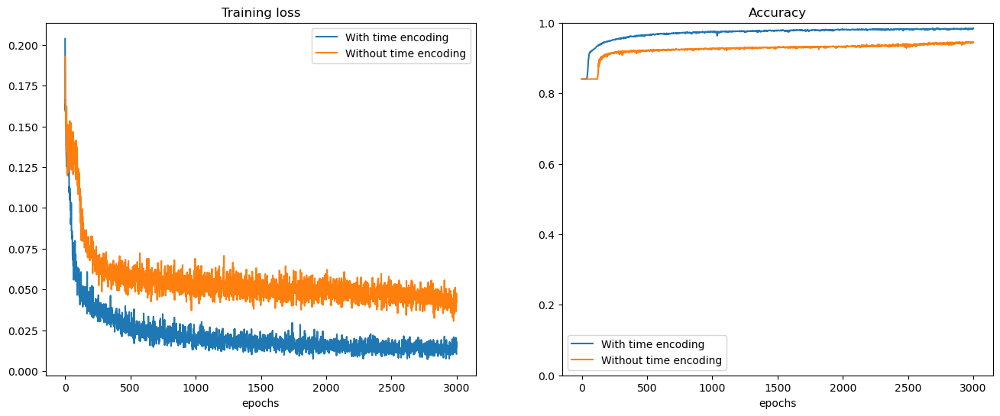

In [65]:
plt.figure(figsize=(8*2,6))

plt.subplot(1,2,1)
plt.plot([x[0] for x in loss_list[0]], [x[1] for x in loss_list[0]], label='With time encoding')
plt.plot([x[0] for x in loss_list[1]], [x[1] for x in loss_list[1]], label='Without time encoding')
plt.title('Training loss')
plt.legend()
plt.xlabel('epochs')

plt.subplot(1,2,2)
plt.plot([x[0] for x in accuracy_list[0]], [x[1] for x in accuracy_list[0]], label='With time encoding')
plt.plot([x[0] for x in accuracy_list[1]], [x[1] for x in accuracy_list[1]], label='Without time encoding')
plt.title('Accuracy')
plt.ylim(0.,1.)
plt.xlabel('epochs')
plt.legend()

print('Accuracy with time encoding : {:.3f} without: {:.3f}'.format(accuracy_list[0][-1][1],accuracy_list[1][-1][1]))

**Question 5e**
<a name='question5e'></a>

Implement batching to prevent memory issues when evaluating large number of pixels with the MLP. Batch size should not exceed 16000.

Write a partition indexing function to create a list of partition indices that can be used to split the input into equal size chunks for prediction

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [66]:
def partition_index(totalsize, chunksize):
    '''
    Args:
        - totalsize: int, Size of the batch to process
        - chunksize: int, subdivision to apply
    Return:
        - list_tuples: List, List of tuples (i,j) to process the batch in equal chunk
    '''
    #begin_solution
    list_tuples = []
    for start in range(0, totalsize, chunksize):
        # The end is either the start + chunksize or the end of the array
        end = min(start + chunksize, totalsize)
        list_tuples.append((start, end))
    #end_solution

    return list_tuples

Update image prediction to use the implemented batch partitioning

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
def predict_images(images, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
  '''
  #begin_solution
  
  #end_solution


  return prediction


**Question 5f**
<a name='question5f'></a>

Write code to generate a video of 100 frames uniformly sampled between the first and last frame. Save the video as an MP4.

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [ ]:
output_path = 'result_bw_video.mp4'
#begin_solution
images = torch.tensor(X_resized, dtype = torch.float32)
with torch.no_grad():
    U = predict_images(images, model, device=device)
U = U.reshape((images.shape[0],images.shape[1],images.shape[2])).cpu()
U_bw = (U>0.5).type(torch.int32).cpu()

for i in range(images.shape[0]):

    plt.figure(figsize=(12,6))

    plt.subplot(1,3,1)
    plt.title('Implicit rep.')
    plt.imshow(U[i].cpu().numpy())
    plt.colorbar()
    plt.clim(0,1)

    plt.subplot(1,3,2)
    plt.imshow(U_bw[i].cpu().numpy())
    plt.title('Prediction')

    plt.subplot(1,3,3)
    plt.imshow(images[i].cpu())
    plt.title(f'Ground truth Frame {i}')
#end_solution

Video(output_path)